# Price Prediction with Neural Network

# Testing Multi-Layer Perceptron

Imports

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Dense, Activation, Dropout, DenseFeatures
from keras.models import Sequential
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns

Input Airbnb data

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Input listings, neigbourhoods, reviews - Airbnb datasets
listings = pd.read_csv('nov2020/listings.csv')
print (listings.head())
neighbourhoods = pd.read_csv('nov2020/neighbourhoods.csv')
print (neighbourhoods.head())
reviews = pd.read_csv('nov2020/reviews.csv')
print (reviews.head())


      id                         listing_url       scrape_id last_scraped  \
0  11551  https://www.airbnb.com/rooms/11551  20201106040109   2020-11-07   
1  13913  https://www.airbnb.com/rooms/13913  20201106040109   2020-11-07   
2  15400  https://www.airbnb.com/rooms/15400  20201106040109   2020-11-07   
3  17402  https://www.airbnb.com/rooms/17402  20201106040109   2020-11-06   
4  17506  https://www.airbnb.com/rooms/17506  20201106040109   2020-11-07   

                                                name  \
0         Arty and Bright London Apartment in Zone 2   
1                Holiday London DB Room Let-on going   
2                Bright Chelsea  Apartment. Chelsea!   
3              Superb 3-Bed/2 Bath & Wifi: Trendy W1   
4  Boutique Chelsea/Fulham Double bed 5-star ensuite   

                                         description  \
0  Unlike most rental apartments out there my fla...   
1  My bright double bedroom with a large window h...   
2  Lots of windows and light.  S

      id                         listing_url       scrape_id last_scraped  \
0  11551  https://www.airbnb.com/rooms/11551  20201106040109   2020-11-07   
1  13913  https://www.airbnb.com/rooms/13913  20201106040109   2020-11-07   
2  15400  https://www.airbnb.com/rooms/15400  20201106040109   2020-11-07   
3  17402  https://www.airbnb.com/rooms/17402  20201106040109   2020-11-06   
4  17506  https://www.airbnb.com/rooms/17506  20201106040109   2020-11-07   

                                                name  \
0         Arty and Bright London Apartment in Zone 2   
1                Holiday London DB Room Let-on going   
2                Bright Chelsea  Apartment. Chelsea!   
3              Superb 3-Bed/2 Bath & Wifi: Trendy W1   
4  Boutique Chelsea/Fulham Double bed 5-star ensuite   

                                         description  \
0  Unlike most rental apartments out there my fla...   
1  My bright double bedroom with a large window h...   
2  Lots of windows and light.  S

C:\Users\44756\anaconda3\lib\site-packages\scipy\stats\stats.py:4594: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


id                                                  0
listing_url                                         0
scrape_id                                           0
last_scraped                                        0
name                                               23
                                                ...  
calculated_host_listings_count                      0
calculated_host_listings_count_entire_homes         0
calculated_host_listings_count_private_rooms        0
calculated_host_listings_count_shared_rooms         0
reviews_per_month                               21733
Length: 74, dtype: int64
id                                                  0
listing_url                                         0
scrape_id                                           0
last_scraped                                        0
name                                               23
                                                ...  
calculated_host_listings_count                      0
cal

ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type int).

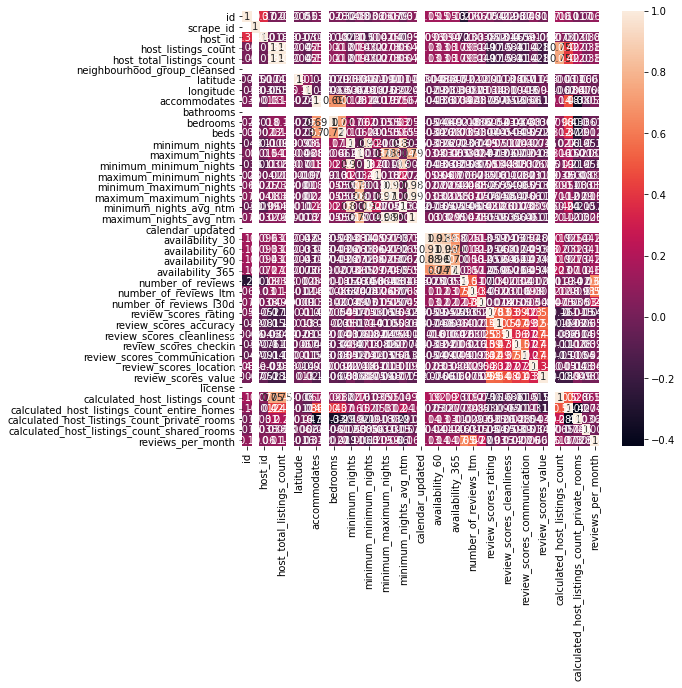

In [3]:
# Input listings, neigbourhoods, reviews - Airbnb datasets
listings = pd.read_csv('nov2020/listings.csv')
print (listings.head())
neighbourhoods = pd.read_csv('nov2020/neighbourhoods.csv')
print (neighbourhoods.head())
reviews = pd.read_csv('nov2020/reviews.csv')
print (reviews.head())

# Correlation
corr = listings.corr(method='kendall')
plt.figure(figsize=(8,8))
sns.heatmap(corr, annot=True)


# Need to check which columns to exclude
# Columns and their empty values:
print (listings.isnull().sum())

# Too mmany null values: neighbourhood_group (all), last_review (21733), reviews_per_month (21733)
# Unnecessary: id, name, host_id, host_name

#removed_columns = ['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'last_review', 'reviews_per_month']
#listings = listings.drop(removed_columns, axis=1)

print (listings.isnull().sum())


# Factorise to convert data types

listings['neighbourhood'] = pd.factorize(listings.neighbourhood)[0]
listings['room_type'] = pd.factorize(listings.room_type)[0]

print (listings.head())

# Splitting data
X = listings
y = listings['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=0)

print(X_train)
print(X_test)
print(y_train)
print(y_test)

# Keras Sequential Model

tf.keras.backend.set_floatx('float32')
model = tf.keras.Sequential([
    #DenseFeatures(feature_layer),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(1)    
])

opt = tf.keras.optimizers.Adam(learning_rate=0.05)
rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(optimizer=opt, loss='mean_squared_error', metrics=['mae',rmse])

lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',patience=2,factor=0.2)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=10)
callbacks = [lr_reducer, early_stopper]

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), callbacks=callbacks, epochs=50, batch_size=64)

Repeating using Hui's data cleaning methods

# Data Import

In [4]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns


raw_listings = pd.read_csv('nov2020/listings.csv') # (76984, 74)


#raw_reviews = pd.read_csv('data/06 Nov 2020 reviews.csv')
#raw_calendar = pd.read_csv('data/05 nov 2020 calendar.csv') #(28099082, 7)

#raw_listings_2019 = pd.read_csv('data/05 Nov 2019.csv') #(85068, 106)

#daily_cases = pd.read_csv('data/region_2021-12-01.csv') #(659, 6)



# Data Cleaning

In [5]:
pd.set_option("display.max_columns", raw_listings.shape[1]) #display all columns
print(raw_listings.shape)
raw_listings.head()

(76984, 74)


,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,https://www.airbnb.com/rooms/11551,20201106040109,2020-11-07,Arty and Bright London Apartment in Zone 2,Unlike most rental apartments out there my fla...,Not even 10 minutes by metro from Victoria Sta...,https://a0.muscache.com/pictures/b7afccf4-18e5...,43039,https://www.airbnb.com/users/show/43039,Adriano,2009-10-03,"London, England, United Kingdom","Hello, I'm a friendly Italian man with a very ...",within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/47773...,https://a0.muscache.com/im/pictures/user/47773...,Brixton,3.0,3.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"London, United Kingdom",Lambeth,NaN,51.46225,-0.11732,Entire apartment,Entire home/apt,4,NaN,1 bath,1.0,3.0,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ...",$97.00,7,190,7,28,1125,1125,8.4,1125.0,NaN,t,0,0,4,279,2020-11-07,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,9.0,NaN,t,2,2,0,0,1.48
1,13913,https://www.airbnb.com/rooms/13913,20201106040109,2020-11-07,Holiday London DB Room Let-on going,My bright double bedroom with a large window h...,Finsbury Park is a friendly melting pot commun...,https://a0.muscache.com/pictures/miso/Hosting-...,54730,https://www.airbnb.com/users/show/54730,Alina,2009-11-16,"London, England, United Kingdom",I am a Multi-Media Visual Artist and Creative ...,within a day,83%,71%,f,https://a0.muscache.com/im/users/54730/profile...,https://a0.muscache.com/im/users/54730/profile...,LB of Islington,3.0,3.0,"['email', 'phone', 'facebook', 'reviews', 'off...",t,t,"Islington, Greater London, United Kingdom",Islington,NaN,51.56802,-0.11121,Private room in apartment,Private room,2,NaN,1 shared bath,1.0,0.0,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa...",$40.00,1,29,1,28,29,29,2.8,29.0,NaN,t,30,60,90,365,2020-11-07,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,9.0,NaN,f,2,1,1,0,0.17
2,15400,https://www.airbnb.com/rooms/15400,20201106040109,2020-11-07,Bright Chelsea Apartment. Chelsea!,Lots of windows and light. St Luke's Gardens ...,It is Chelsea.,https://a0.muscache.com/pictures/428392/462d26...,60302,https://www.airbnb.com/users/show/60302,Philippa,2009-12-05,"Kensington, England, United Kingdom","English, grandmother, I have travelled quite ...",within a day,100%,100%,f,https://a0.muscache.com/im/users/60302/profile...,https://a0.muscache.com/im/users/60302/profile...,Chelsea,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"London, United Kingdom",Kensington and Chelsea,NaN,51.48796,-0.16898,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ...",$75.00,10,50,10,28,50,50,11.2,50.0,NaN,t,0,20,50,150,20

In [6]:
pd.set_option("display.max_rows", raw_listings.shape[0])
raw_listings.isnull().sum().sort_values(ascending=False)

neighbourhood_group_cleansed                    76984
license                                         76984
bathrooms                                       76984
calendar_updated                                76984
host_response_time                              37618
host_response_rate                              37618
host_about                                      33765
neighborhood_overview                           29148
neighbourhood                                   29147
host_acceptance_rate                            28432
review_scores_checkin                           23603
review_scores_value                             23602
review_scores_location                          23601
review_scores_accuracy                          23555
review_scores_communication                     23552
review_scores_cleanliness                       23545
review_scores_rating                            23490
first_review                                    21733
last_review                 

# Missing Data

<AxesSubplot:>

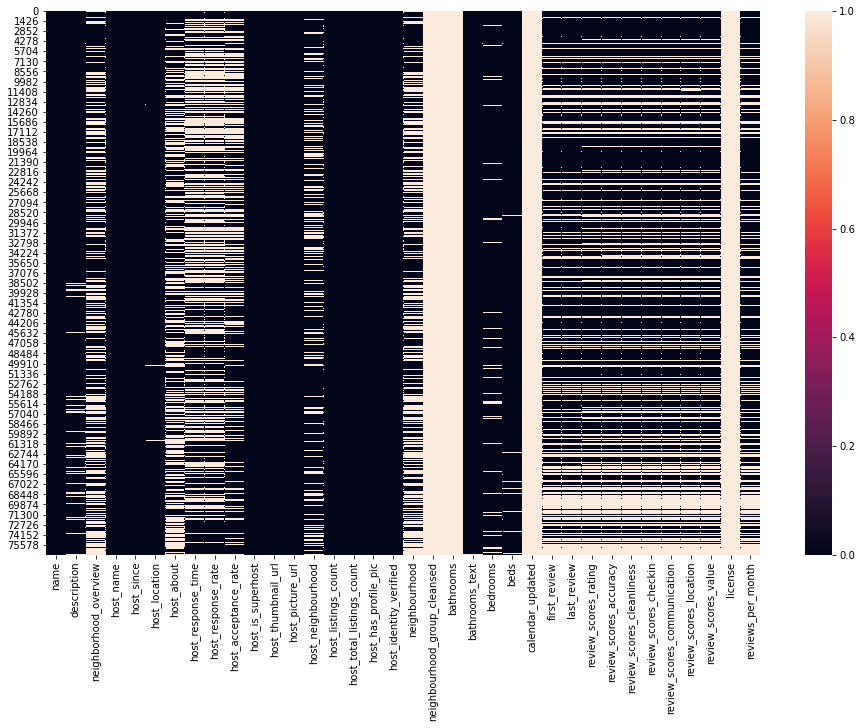

In [7]:
missing_val_cols = raw_listings.columns[raw_listings.isnull().sum() > 0]
fig, ax = plt.subplots(figsize=(16,10)) 
sns.heatmap(raw_listings[missing_val_cols].isnull(), cbar=True)

# Dropping initial columns

In [8]:
to_drop = ['listing_url', 'scrape_id', 'name', 'description', 'neighborhood_overview', 'picture_url',
              'host_url', 'host_name', 'host_location', 'host_about', 'host_thumbnail_url', 
               'host_verifications', 'neighbourhood', 'neighbourhood_group_cleansed',
               'bathrooms', 'calendar_updated', 'calendar_last_scraped', 'license', 'host_picture_url', 
               'host_neighbourhood', #'host_response_time'
              ]

listings = raw_listings.drop(to_drop, axis=1)

In [9]:
#Print out the sum of missing values for every column. 
#While we've dropped free text columns, we still need to do a lot of work in regards to missing data.
print(listings.shape)
listings.isna().sum().sort_values(ascending=False)

(76984, 54)


host_response_time                              37618
host_response_rate                              37618
host_acceptance_rate                            28432
review_scores_checkin                           23603
review_scores_value                             23602
review_scores_location                          23601
review_scores_accuracy                          23555
review_scores_communication                     23552
review_scores_cleanliness                       23545
review_scores_rating                            23490
first_review                                    21733
last_review                                     21733
reviews_per_month                               21733
bedrooms                                         4746
beds                                             1080
bathrooms_text                                    160
host_total_listings_count                          11
host_identity_verified                             11
host_has_profile_pic        

In [10]:
# Minimum and maximum nights columns

print(100 * sum(listings.maximum_nights_avg_ntm == listings.maximum_nights) / len(listings)) 
print(100 * sum(listings.maximum_maximum_nights == listings.maximum_nights) / len(listings))

listings = listings.drop(['maximum_nights_avg_ntm', 'minimum_minimum_nights', 'minimum_maximum_nights',
                          'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights',
                          'minimum_nights_avg_ntm'], axis=1)
print(listings.shape)
listings.describe().T

86.78946274550556
87.77797983996675
(76984, 48)


,count,mean,std,min,25%,50%,75%,max
id,76984.0,2.562503e+07,1.319053e+07,11551.00000,1.509091e+07,2.585057e+07,3.760606e+07,4.626152e+07
host_id,76984.0,9.517164e+07,1.001727e+08,2010.00000,1.612489e+07,4.947226e+07,1.529558e+08,3.745225e+08
host_listings_count,76973.0,2.359588e+01,1.243611e+02,0.00000,1.000000e+00,1.000000e+00,3.000000e+00,1.490000e+03
host_total_listings_count,76973.0,2.359588e+01,1.243611e+02,0.00000,1.000000e+00,1.000000e+00,3.000000e+00,1.490000e+03
latitude,76984.0,5.150993e+01,4.751437e-02,51.28337,5.148414e+01,5.151403e+01,5.153924e+01,5.168523e+01
longitude,76984.0,-1.282558e-01,9.481499e-02,-0.49687,-1.886225e-01,-1.260000e-01,-6.948000e-02,2.885700e-01
accommodates,76984.0,3.077393e+00,1.947671e+00,1.00000,2.000000e+00,2.000000e+00,4.000000e+00,1.600000e+01
bedrooms,72238.0,1.487818e+00,8.849293e-01,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,5.000000e+01
beds,75904.0,1.706814e+00,1.275783e+00,0.00000,1.000000e+00,1.000000e+00,2.000000e+00,5.000000e+01
minimum_nights,76984.0,5.142120e+00,2.247701e+01,1.00000,1.000000e+00,2.000000e+00,3.000000e+00,1.125000e+03


In [11]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76984 entries, 0 to 76983
Data columns (total 48 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            76984 non-null  int64  
 1   last_scraped                                  76984 non-null  object 
 2   host_id                                       76984 non-null  int64  
 3   host_since                                    76973 non-null  object 
 4   host_response_time                            39366 non-null  object 
 5   host_response_rate                            39366 non-null  object 
 6   host_acceptance_rate                          48552 non-null  object 
 7   host_is_superhost                             76973 non-null  object 
 8   host_listings_count                           76973 non-null  float64
 9   host_total_listings_count                     76973 non-null 

array([[<AxesSubplot:title={'center':'id'}>,
        <AxesSubplot:title={'center':'host_id'}>,
        <AxesSubplot:title={'center':'host_is_superhost'}>,
        <AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'host_has_profile_pic'}>],
       [<AxesSubplot:title={'center':'host_identity_verified'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'accommodates'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'has_availability'}>,
        <AxesSubplot:title={'center':'availability_30'}>,
        <AxesSubplot:title={'center':'availability_60'}>,
        <AxesSubplot:title={'center':'av

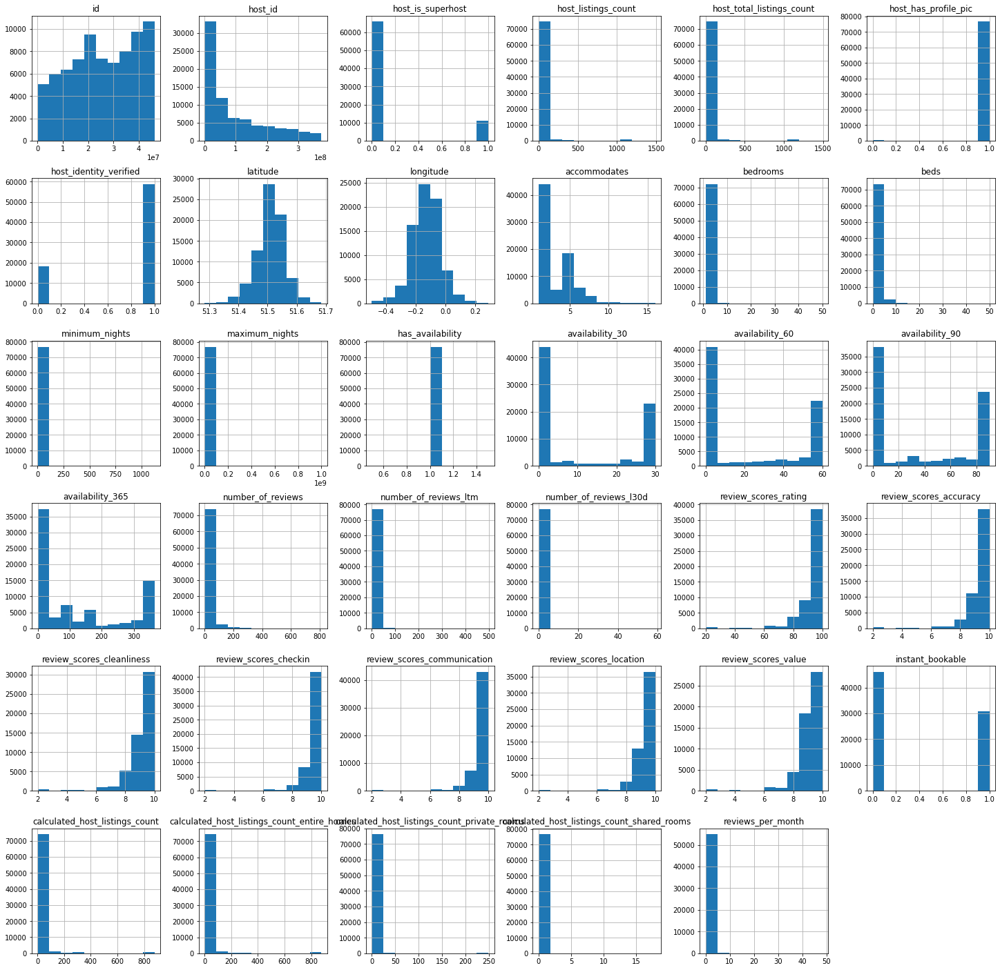

In [12]:
#Check if boolean and numeric columns have enough varibility to make them worth including

# Replace columns with categorical values t and f with 1 and 0
listings = listings.replace({'f': 0, 't': 1})

# Plot the histogram of numerical and boolean columns
listings.hist(figsize=(25, 25))

In [13]:
#listings = listings.drop(['has_availability', 'calculated_host_listings_count_shared_rooms'], axis=1)

In [14]:
# Lambda function to remove special characters and convert to float
strip_and_convert = lambda col: col.str.extract('(\d+)', expand=False).astype(float, errors='ignore')

# strip_and_convert function wil be applied on the below columns
cols_to_numeric = ['host_response_rate', 'host_acceptance_rate', 'bathrooms_text', 'price']
listings[cols_to_numeric] = listings[cols_to_numeric].apply(strip_and_convert)
# Rename bathrooms_text column
listings = listings.rename(columns={'bathrooms_text': 'bathrooms'})
print(listings.shape)
listings.head()

(76984, 48)


,id,last_scraped,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,2020-11-07,43039,2009-10-03,within an hour,100.0,100.0,0.0,3.0,3.0,1.0,1.0,Lambeth,51.46225,-0.11732,Entire apartment,Entire home/apt,4,1.0,1.0,3.0,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ...",97.0,7,190,1,0,0,4,279,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,9.0,1,2,2,0,0,1.48
1,13913,2020-11-07,54730,2009-11-16,within a day,83.0,71.0,0.0,3.0,3.0,1.0,1.0,Islington,51.56802,-0.11121,Private room in apartment,Private room,2,1.0,1.0,0.0,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa...",40.0,1,29,1,30,60,90,365,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,9.0,0,2,1,1,0,0.17
2,15400,2020-11-07,60302,2009-12-05,within a day,100.0,100.0,0.0,1.0,1.0,1.0,1.0,Kensington and Chelsea,51.48796,-0.16898,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ...",75.0,10,50,1,0,20,50,150,89,1,0,2009-12-21,2020-03-16,96.0,10.0,10.0,10.0,10.0,10.0,9.0,1,1,1,0,0,0.67
3,17402,2020-11-06,67564,2010-01-04,within an hour,67.0,100.0,1.0,18.0,18.0,1.0,1.0,Westminster,51.52195,-0.14094,Entire apartment,Entire home/apt,6,2.0,3.0,3.0,"[""Bed linens"", ""Coffee maker"", ""Dryer"", ""Paid ...",307.0,4,365,1,25,55,85,330,42,0,0,2011-03-21,2019-11-02,94.0,10.0,9.0,9.0,9.0,10.0,9.0,0,15,15,0,0,0.36
4,17506,2020-11-07,67915,2010-01-05,NaN,NaN,NaN,0.0,3.0,3.0,1.0,1.0,Hammersmith and Fulham,51.47935,-0.19743,Private room in bed and breakfast,Private room,2,1.0,1.0,1.0,"[""TV"", ""Heating"", ""Shower gel"", ""Wifi"", ""Smoke...",150.0,3,21,1,29,59,89,364,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,0,2,0,NaN


In [15]:
# Host-related columns

listings[['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified']].isnull().sum()

#Since it's a small number, we will drop these rows.
listings = listings.dropna(subset=['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified'], axis=0)

listings[['host_since', 'host_is_superhost', 'host_listings_count', 'host_has_profile_pic', 'host_identity_verified']].isnull().sum()

print(listings.shape)


(76973, 48)


In [16]:

# host_since column contains dates in the format YYYY-MM-DD.
# Feature engineering:
# To be able to use the column in our model, we will transform the host_since column to numerical: the new column will be the difference (in days) between the date the dataset was scraped and host_since column.

# Convert to datetime object
listings['last_scraped'] = pd.to_datetime(listings['last_scraped'])
listings['host_since'] = pd.to_datetime(listings['host_since'])

#Created a new feature to calculate the difference in days:
listings['days_host_since'] = (listings['last_scraped'] - listings['host_since']).dt.days

# Remove host_since and other unnecessary columns
listings = listings.drop(['host_since', 'id', 'host_id'], axis=1)

listings['days_host_since'].describe()
#listings.head()

count    76973.000000
mean      1755.958739
std        845.728491
min          2.000000
25%       1130.000000
50%       1807.000000
75%       2342.000000
max       4468.000000
Name: days_host_since, dtype: float64

# Property Type

Entire apartment                      0.419615
Private room in apartment             0.233225
Private room in house                 0.144674
Entire house                          0.073207
Private room in townhouse             0.020163
Entire condominium                    0.015213
Entire townhouse                      0.012680
Entire serviced apartment             0.012550
Private room in condominium           0.008081
Private room in bed and breakfast     0.006808
Entire loft                           0.005573
Room in boutique hotel                0.005560
Room in serviced apartment            0.003858
Shared room in apartment              0.003858
Room in hotel                         0.003781
Private room in loft                  0.003313
Private room in guest suite           0.002442
Private room in guesthouse            0.002403
Entire guest suite                    0.002364
Shared room in house                  0.001702
Room in aparthotel                    0.001624
Entire guesth

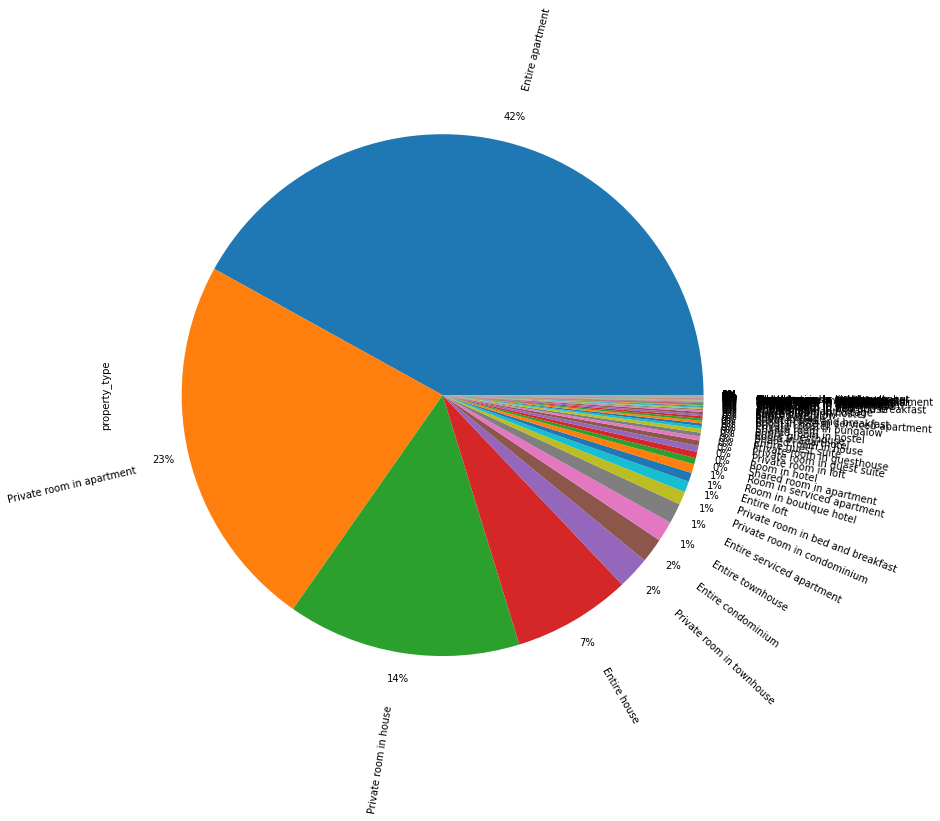

In [17]:
# calculate the percentage of each property type.
display(listings['property_type'].value_counts(normalize=True))

# plot the pie chart of property categories
plt.figure(figsize = (20, 12))
listings['property_type'].value_counts(normalize=True).plot.pie(autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2, rotatelabels=True)
plt.show()

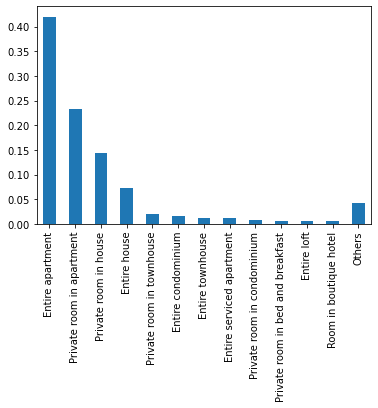

Property types: ['Entire apartment', 'Private room in apartment', 'Private room in house'] make up 79.75 % of the total property types


In [18]:
prob = listings['property_type'].value_counts(normalize=True)
# Setting a threshold. This threshold means that if the frequency of the property types that is less than this value, they will be categorised as 'Others'
threshold = 0.005
mask = prob > threshold
tail_prob = prob.loc[~mask].sum()
prob = prob.loc[mask]
prob['Others'] = tail_prob
prob.plot(kind='bar')
plt.xticks(rotation=90)
plt.show()

print("Property types: {} make up {} % of the total property types".format(
    list(prob[:3].index), 
    round(prob[:3].sum(), 4) * 100
))

In [19]:
# Replace with Other if the frequency of the category is below set threshold (we set it at 0.005, refer to above) 
listings.loc[~listings['property_type'].isin(prob.index.drop('Others')), 'property_type'] = 'Others'
listings['property_type'].value_counts()

Entire apartment                     32299
Private room in apartment            17952
Private room in house                11136
Entire house                          5635
Others                                3283
Private room in townhouse             1552
Entire condominium                    1171
Entire townhouse                       976
Entire serviced apartment              966
Private room in condominium            622
Private room in bed and breakfast      524
Entire loft                            429
Room in boutique hotel                 428
Name: property_type, dtype: int64

In [20]:
# Bathrooms, bedrooms, beds

fill_median = lambda col: col.fillna(col.median())
listings[['bathrooms', 'bedrooms', 'beds']] = listings[['bathrooms', 'bedrooms', 'beds']].apply(fill_median)

listings[['bathrooms', 'bedrooms', 'beds']].isnull().sum()

bathrooms    0
bedrooms     0
beds         0
dtype: int64

In [21]:
# First_review and last_review

100 * listings[['first_review', 'last_review']].isnull().sum() / len(listings)

first_review    28.225482
last_review     28.225482
dtype: float64

In [22]:
listings[['first_review','last_review']].isnull().sum()

first_review    21726
last_review     21726
dtype: int64

In [23]:
# Convert to datetime object
listings['first_review'] = pd.to_datetime(listings['first_review'])
listings['last_review'] = pd.to_datetime(listings['last_review'])

# New feature to calculate number of days between review date and the date the dataset was scrapped
listings['days_since_first_review'] = (listings['last_scraped'] - listings['first_review'])
listings['days_since_last_review'] = (listings['last_scraped'] - listings['last_review'])

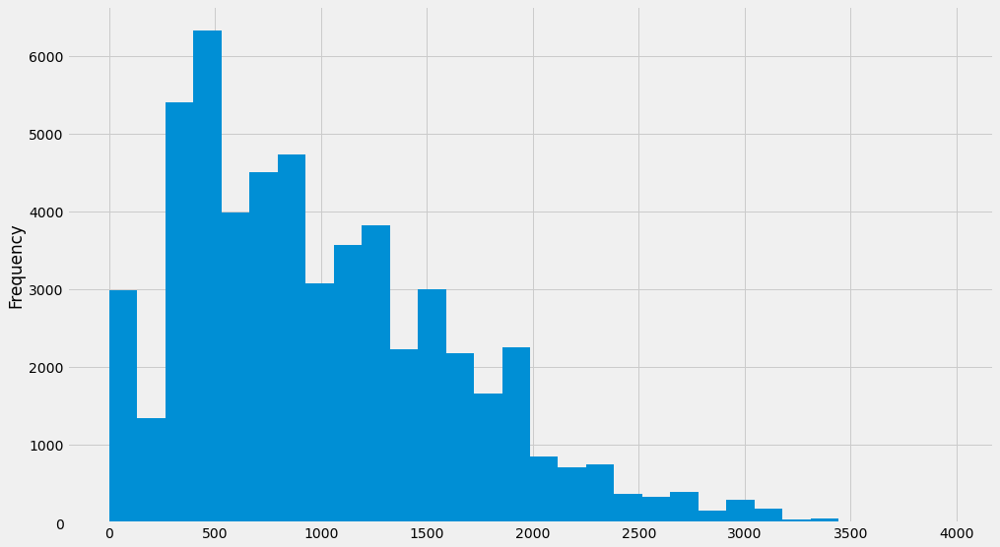

In [24]:
from datetime import datetime, timedelta

plt.style.use('fivethirtyeight')

listings['days_since_first_review'].dt.days.plot(kind='hist', bins=30, figsize=(15,9));
def categorise_col(col_name, new_col, bins, labels):
    listings[new_col] = pd.cut(listings[col_name], bins, labels=labels)
    listings[new_col] = listings[new_col].astype('str')
    listings[new_col] = listings[new_col].str.replace('nan', 'No reviews')
    listings[new_col] = listings[new_col].astype('category')
    
bins = pd.to_timedelta([0, 182, 365, 730, 1460, max(listings['days_since_first_review'])], unit='days')
labels = ['0-6 months',
           '6-12 months',
           '1-2 years',
           '2-3 years',
           '4+ years']
categorise_col('days_since_first_review', 'days_since_first_review_cats', bins, labels)

21727

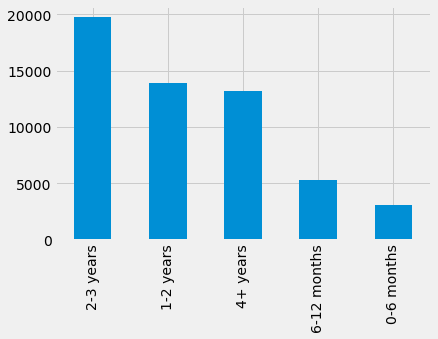

In [25]:
listings['days_since_first_review_cats'].value_counts().plot(kind='bar')
listings['days_since_first_review_cats'].isnull().sum()

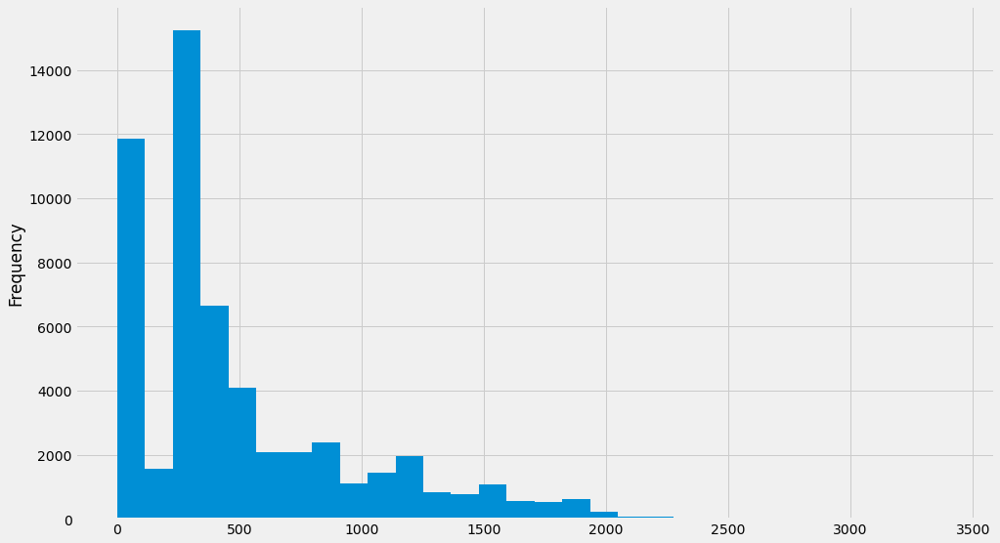

In [26]:
listings['days_since_last_review'].dt.days.plot(kind='hist', bins=30, figsize=(15,9));

21731

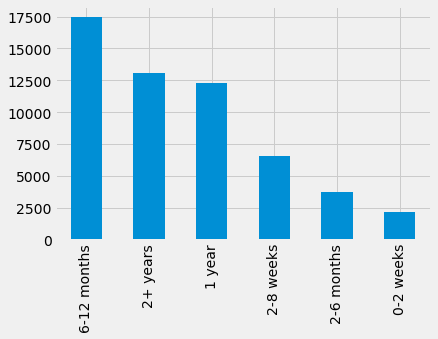

In [27]:
bins2 = pd.to_timedelta([0, 14, 60, 182, 365, 730, max(listings['days_since_last_review'])], unit='days')
labels2 = ['0-2 weeks', '2-8 weeks', '2-6 months', '6-12 months', '1 year', '2+ years']

categorise_col('days_since_last_review', 'days_since_last_review_cats', bins=bins2, labels=labels2)
listings['days_since_last_review_cats'].value_counts().plot(kind='bar');
listings['days_since_last_review_cats'].isnull().sum()

# # Storing the first_review column in a variable for Exploratory Data Analysis
# first_review = listings['first_review']
# review_scores_rating = listings['review_scores_rating']

# Review scores columns

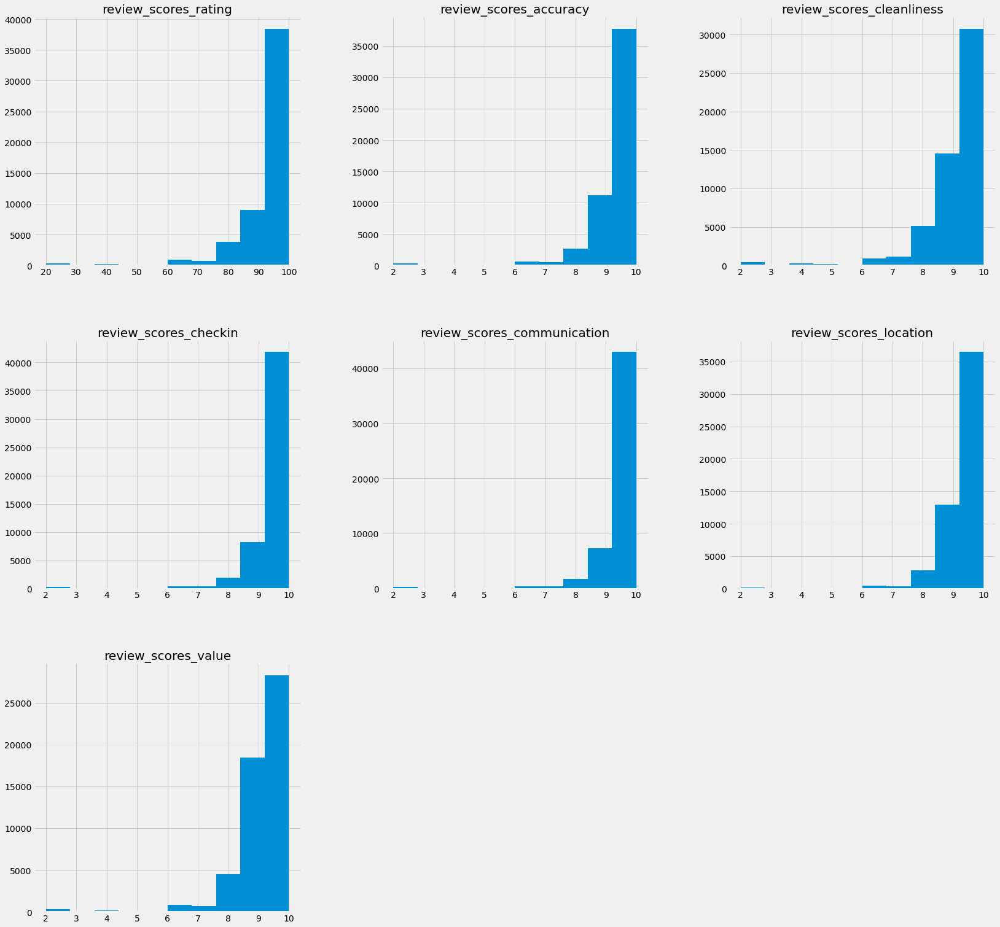

In [28]:
listings.isnull().sum().sort_values(ascending=False)
review_cols = listings.columns[listings.columns.str.startswith("review_scores")]
listings[review_cols].hist(figsize=(25, 25));

In [29]:
# Categorising columns out of 10
review_cols_10 = ['review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']
new_cols_10 = [s + "_cats" for s in review_cols_10]
bins3 = [0, 8, 9, 10]
labels3 = ['0-8/10', '9/10', '10/10']

for i, col in enumerate(review_cols_10):
    categorise_col(col, new_cols_10[i], bins=bins3, labels=labels3)

# Categorising column out of 10
categorise_col('review_scores_rating', 'review_scores_rating_cat', 
               bins=[0, 80, 95, 100], 
               labels=['0-79/100', '80-94/100', '95-100/100'])

# Dealing with outliers in prices

Mean price: £ 100.05314850661921
Median price: £ 74.0
Standard Deviation of Price: £ 94.79769234126594
Four times Standard Deviation: £ 379.1907693650638
Number of outliers:  922
Percentage greater than 4X standard deviation:  2.1786860327647357


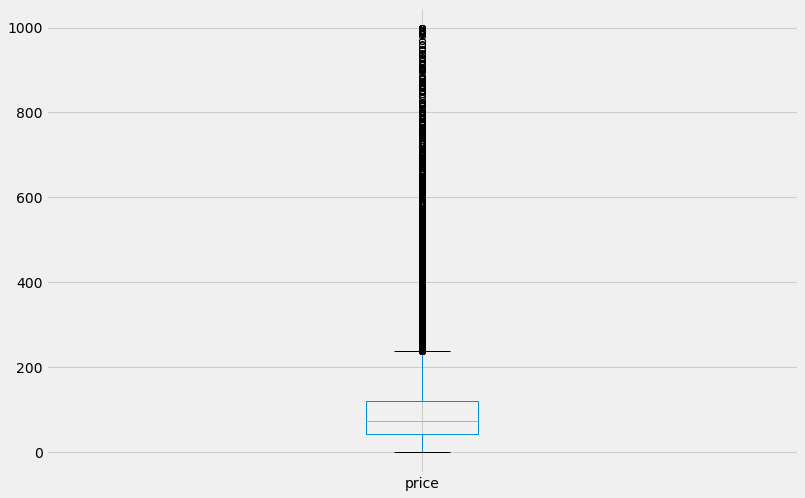

In [30]:
listings['price'].plot(kind='box', figsize=(12, 8));

meanPrice = listings['price'].mean()
medianPrice = listings['price'].median()
stdDevPrice = listings['price'].std()
print('Mean price: £', meanPrice)
print('Median price: £', medianPrice)
print('Standard Deviation of Price: £', stdDevPrice)
print('Four times Standard Deviation: £', 4 *stdDevPrice)

outliers = abs(listings['price'] - meanPrice) > 4 * stdDevPrice

print('Number of outliers: ', outliers.sum())

#6 *std = 568.7611414677139 plus mean = 668 ==> there's 306 above this price
#5 *std = 473.9676178897616 plus mean = 573 ==> there's 477 above this price
#4 *std = 379.17409431180926 plus mean = 479 ==> there's 922 above this price
#3.5 *std = 284.3805707338569 plus mean = 384 ==> there's 1641 above this price
print('Percentage greater than 4X standard deviation: ', 100 * (len(listings[listings['price'] > 379]) / len(listings)))

listings = listings[listings['price'] < 379]

In [31]:
listings.host_response_time.isnull().sum()

37099

In [32]:
listings['host_response_time'] = listings['host_response_time'].fillna('not provided')

In [33]:
listings.host_response_time.isnull().sum()

0

In [34]:
df_not_num = listings.select_dtypes(include = ['O'])
print('There are {} non numerical features including:\n{}'.format(len(df_not_num.columns), df_not_num.columns.tolist()))
df_not_num.head(4)

There are 5 non numerical features including:
['host_response_time', 'neighbourhood_cleansed', 'property_type', 'room_type', 'amenities']


,host_response_time,neighbourhood_cleansed,property_type,room_type,amenities
0,within an hour,Lambeth,Entire apartment,Entire home/apt,"[""Cable TV"", ""Coffee maker"", ""Carbon monoxide ..."
1,within a day,Islington,Private room in apartment,Private room,"[""Cable TV"", ""Bed linens"", ""Coffee maker"", ""Pa..."
2,within a day,Kensington and Chelsea,Entire apartment,Entire home/apt,"[""Cable TV"", ""Coffee maker"", ""Dryer"", ""Dishes ..."
3,within an hour,Westminster,Entire apartment,Entire home/apt,"[""Bed linens"", ""Coffee maker"", ""Dryer"", ""Paid ..."


<ipython-input-35-d4c229e8ad55>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-35-d4c229e8ad55>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
<ipython-input-35-d4c229e8ad55>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-35-d4c229e8ad55>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
<ipython-input-35-d4c229e8ad55>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
<ipython-input-35-d4c229e8ad55>:15: UserWarning: FixedFormatter should only be used together with FixedLoca

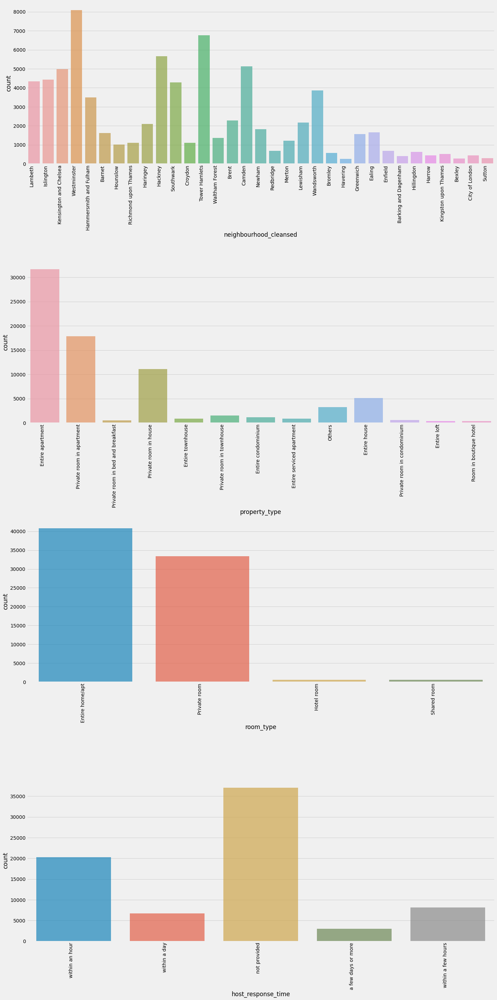

In [35]:
#We are excluding 'amentities' as it is a multi-value feature.

df_not_num = df_not_num[['neighbourhood_cleansed', 'property_type', 'room_type', 'host_response_time']]

#Let's see their distribution

ncols = 1

fig, axes = plt.subplots(round(len(df_not_num.columns) / ncols), ncols, figsize=(20, 40))
#plt.xticks(rotation=90)

for i, ax in enumerate(fig.axes):
    if i < len(df_not_num.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="right")
        sns.countplot(x=df_not_num.columns[i], alpha=0.7, data=df_not_num, ax=ax)

fig.tight_layout()

# Amenities

In [36]:
import re
    
def one_hot_encode_amenities(df):
    '''
    INPUT: 
    df - Original dataframe
    OUTPUT: 
    df_amenities - One-hot encoded dataframe of amenities
        
    Create dummies from list of amenities
    
    '''
    def clean_amenities(row):
        '''
        Remove special characters and split the strings
        '''
        row = re.sub('[^A-Za-z,]+', '', row).split(",")
        return row
        
    df['amenities'] = df['amenities'].apply(clean_amenities)
    
    # Create columns from list of amenities
    df_amenities = df.amenities.str.join('|').str.get_dummies().add_prefix('amenity')
        
    # Include only those amenities that are found in >5% of the listings
    df_amenities = df_amenities[df_amenities.columns[df_amenities.sum() > 0.05 * len(df_amenities)]]
        
    return df_amenities

In [37]:
listings.amenities[5]

'["Coffee maker", "Heating", "Free street parking", "Wifi", "Kitchen", "Smoke alarm", "Washer", "Essentials", "Iron", "Lock on bedroom door", "Hair dryer", "Shampoo", "Hangers", "Laptop-friendly workspace"]'

In [38]:
amenities_df = one_hot_encode_amenities(listings)

In [39]:
listings.shape

(75287, 57)

In [40]:
# Remove amenities column
listings = listings.drop(['amenities'], axis=1)

#Concatenate dataframes
listings = pd.concat([listings, amenities_df], axis=1)
print(listings.shape)
listings.head()

(75287, 103)


,last_scraped,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,...,amenityDryer,amenityElevator,amenityEssentials,amenityExtrapillowsandblankets,amenityFireextinguisher,amenityFirstaidkit,amenityFreeparkingonpremises,amenityFreestreetparking,amenityGardenorbackyard,amenityHairdryer,amenityHangers,amenityHeating,amenityHostgreetsyou,amenityHotwater,amenityIndoorfireplace,amenityIron,amenityKitchen,amenityLaptopfriendlyworkspace,amenityLockbox,amenityLockonbedroomdoor,amenityLongtermstaysallowed,amenityLuggagedropoffallowed,amenityMicrowave,amenityOven,amenityPaidparkingoffpremises,amenityPatioorbalcony,amenityPrivateentrance,amenityPrivatelivingroom,amenityRefrigerator,amenityShampoo,amenityShowergel,amenitySinglelevelhome,amenitySmokealarm,amenityStove,amenityTV,amenityWasher,amenityWifi
0,2020-11-07,within an hour,100.0,100.0,0.0,3.0,3.0,1.0,1.0,Lambeth,51.46225,-0.11732,Entire apartment,Entire home/apt,4,1.0,1.0,3.0,97.0,7,190,1,0,0,4,279,192,7,0,2010-03-21,2020-03-26,91.0,9.0,9.0,10.0,10.0,9.0,...,0,0,1,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,1,0,1,0,1,1,1,0,0,0,1,0,0,0,1,1,1,1,1
1,2020-11-07,within a day,83.0,71.0,0.0,3.0,3.0,1.0,1.0,Islington,51.56802,-0.11121,Private room in apartment,Private room,2,1.0,1.0,0.0,40.0,1,29,1,30,60,90,365,21,2,0,2010-08-18,2020-02-22,97.0,10.0,10.0,10.0,10.0,9.0,...,1,0,1,1,1,0,0,1,0,1,1,1,1,1,0,1,1,1,0,1,1,1,0,1,1,1,0,0,1,1,0,0,1,1,1,1,1
2,2020-11-07,within a day,100.0,100.0,0.0,1.0,1.0,1.0,1.0,Kensington and Chelsea,51.48796,-0.16898,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,75.0,10,50,1,0,20,50,150,89,1,0,2009-12-21,2020-03-16,96.0,10.0,10.0,10.0,10.0,10.0,...,1,0,1,0,1,0,0,0,0,1,1,1,0,1,0,1,1,1,0,0,1,1,1,0,0,0,0,0,1,1,0,0,1,0,1,1,1
3,2020-11-06,within an hour,67.0,100.0,1.0,18.0,18.0,1.0,1.0,Westminster,51.52195,-0.14094,Entire apartment,Entire home/apt,6,2.0,3.0,3.0,307.0,4,365,1,25,55,85,330,42,0,0,2011-03-21,2019-11-02,94.0,10.0,9.0,9.0,9.0,10.0,...,1,1,1,0,0,0,0,0,0,1,1,1,0,1,0,1,1,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,1,1,1,1,1
4,2020-11-07,not provided,NaN,NaN,0.0,3.0,3.0,1.0,1.0,Hammersmith and Fulham,51.47935,-0.19743,Private room in bed and breakfast,Private room,2,1.0,1.0,1.0,150.0,3,21,1,29,59,89,364,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1


# Host_response_rate, host_acceptance_rate, reviews_per_month

AttributeError: 'DataFrame' object has no attribute 'a'

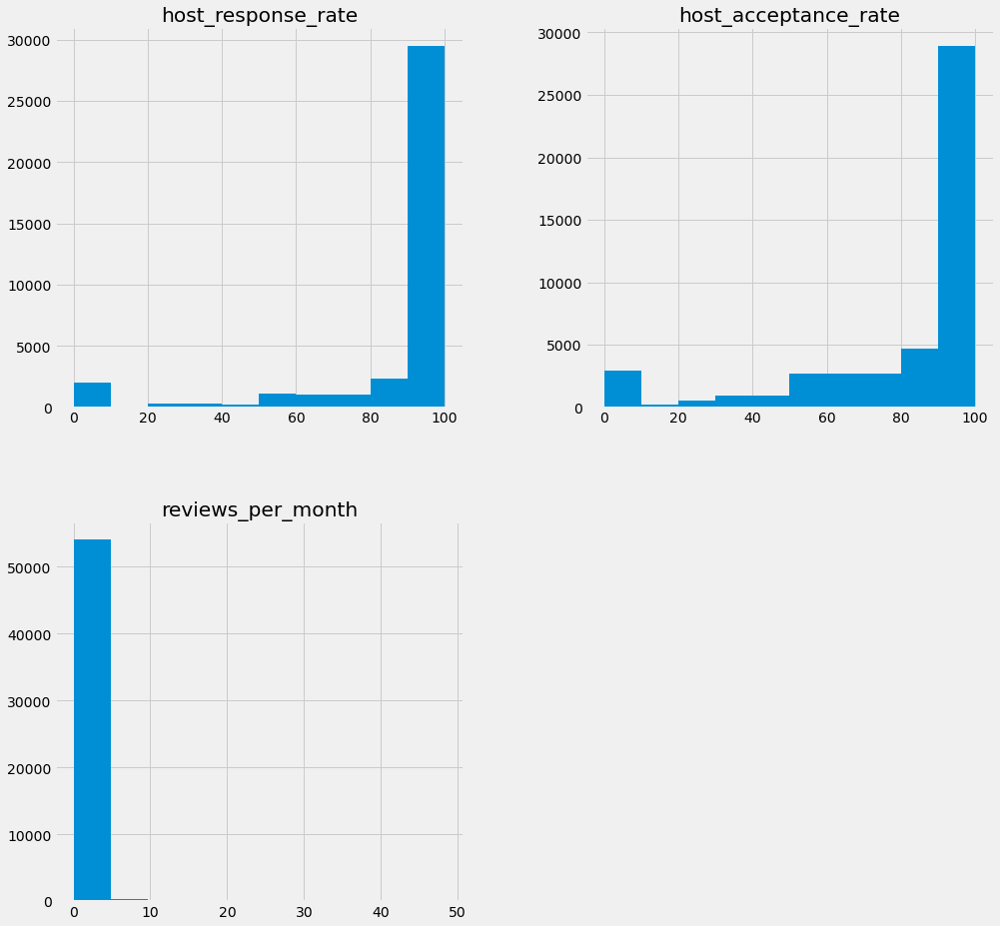

In [41]:
fill_mean = lambda col: col.fillna(col.mean())
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].hist(figsize=(15, 15));
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']] = listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].a

In [42]:
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].isnull().sum()

host_response_rate      37099
host_acceptance_rate    27950
reviews_per_month       20857
dtype: int64

array([[<AxesSubplot:title={'center':'host_response_rate'}>,
        <AxesSubplot:title={'center':'host_acceptance_rate'}>],
       [<AxesSubplot:title={'center':'reviews_per_month'}>,
        <AxesSubplot:>]], dtype=object)

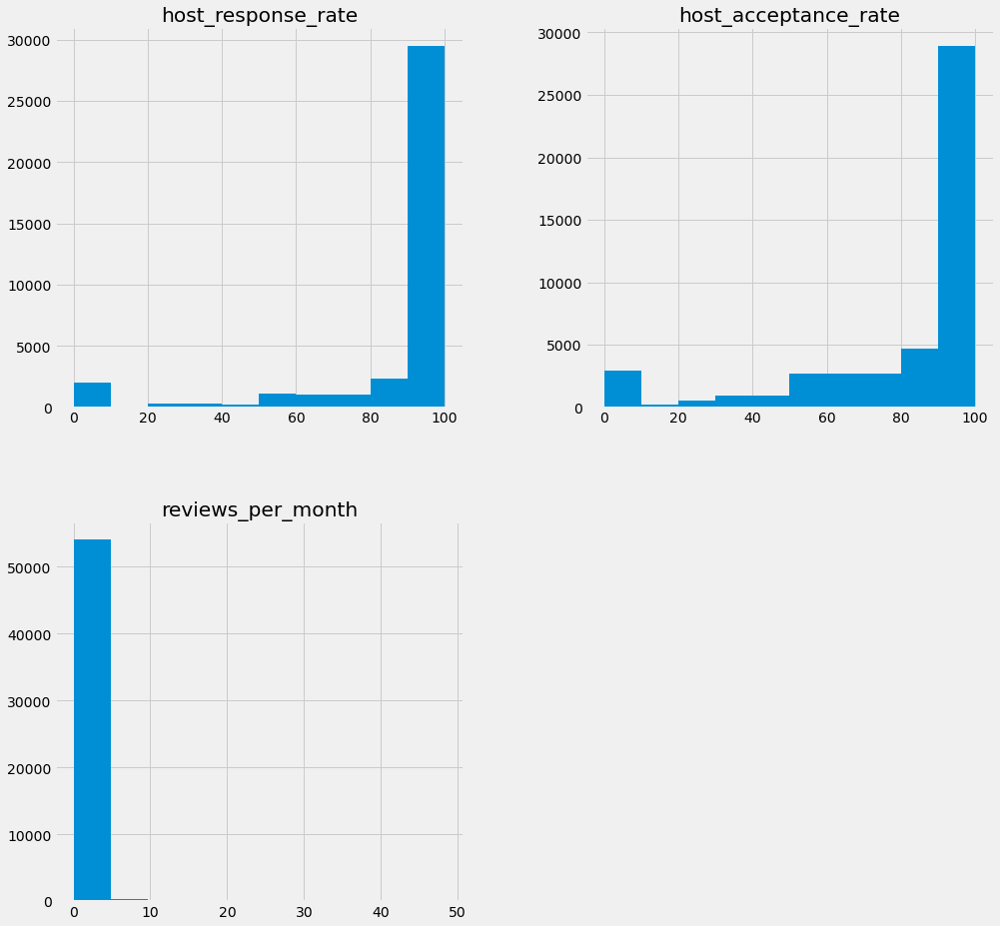

In [43]:
listings[['host_response_rate', 'host_acceptance_rate', 'reviews_per_month']].hist(figsize=(15, 15))

In [44]:
# Dropping initial and intermidiate columns
review_cols = listings.columns[listings.columns.str.startswith("review_scores")]
listings = listings.drop(review_cols, axis=1)
listings = listings.drop(columns=['last_review', 
                                  'days_since_last_review', 'days_since_first_review', 
                                  'first_review', 'last_scraped','host_listings_count'])

# Include all object and category columns
cat_columns = listings.select_dtypes(include=['object', 'category']).columns
for col in cat_columns:    
    listings = pd.concat([listings.drop(col, axis=1), pd.get_dummies(listings[col], prefix=col, prefix_sep='_', drop_first=True)], axis=1) 
    
print(listings.shape)
listings.head()

(75287, 137)


,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,days_host_since,amenityAirconditioning,amenityBathtub,amenityBedlinens,amenityBreakfast,amenityCableTV,amenityCarbonmonoxidealarm,amenityCoffeemaker,...,neighbourhood_cleansed_Kingston upon Thames,neighbourhood_cleansed_Lambeth,neighbourhood_cleansed_Lewisham,neighbourhood_cleansed_Merton,neighbourhood_cleansed_Newham,neighbourhood_cleansed_Redbridge,neighbourhood_cleansed_Richmond upon Thames,neighbourhood_cleansed_Southwark,neighbourhood_cleansed_Sutton,neighbourhood_cleansed_Tower Hamlets,neighbourhood_cleansed_Waltham Forest,neighbourhood_cleansed_Wandsworth,neighbourhood_cleansed_Westminster,property_type_Entire condominium,property_type_Entire house,property_type_Entire loft,property_type_Entire serviced apartment,property_type_Entire townhouse,property_type_Others,property_type_Private room in apartment,property_type_Private room in bed and breakfast,property_type_Private room in condominium,property_type_Private room in house,property_type_Private room in townhouse,property_type_Room in boutique hotel,room_type_Hotel room,room_type_Private room,room_type_Shared room,days_since_first_review_cats_1-2 years,days_since_first_review_cats_2-3 years,days_since_first_review_cats_4+ years,days_since_first_review_cats_6-12 months,days_since_last_review_cats_1 year,days_since_last_review_cats_2+ years,days_since_last_review_cats_2-6 months,days_since_last_review_cats_2-8 weeks,days_since_last_review_cats_6-12 months
0,100.0,100.0,0.0,3.0,1.0,1.0,51.46225,-0.11732,4,1.0,1.0,3.0,97.0,7,190,1,0,0,4,279,192,7,0,1,2,2,0,0,1.48,4053,0,0,0,0,1,1,1,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
1,83.0,71.0,0.0,3.0,1.0,1.0,51.56802,-0.11121,2,1.0,1.0,0.0,40.0,1,29,1,30,60,90,365,21,2,0,0,2,1,1,0,0.17,4009,0,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1
2,100.0,100.0,0.0,1.0,1.0,1.0,51.48796,-0.16898,2,1.0,1.0,1.0,75.0,10,50,1,0,20,50,150,89,1,0,1,1,1,0,0,0.67,3990,1,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
3,67.0,100.0,1.0,18.0,1.0,1.0,51.52195,-0.14094,6,2.0,3.0,3.0,307.0,4,365,1,25,55,85,330,42,0,0,0,15,15,0,0,0.36,3959,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
4,NaN,NaN,0.0,3.0,1.0,1.0,51.47935,-0.19743,2,1.0,1.0,1.0,150.0,3,21,1,29,59,89,364,0,0,0,0,2,0,2,0,NaN,3959,1,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


# Correlation analysis

# Pearson correlation with Price

In [45]:
dfc = pd.DataFrame(listings.corr(method="pearson")["price"])
dfc.reset_index(inplace=True)
dfc.columns = ["features", "correlation_with_price"]
dfc.sort_values("correlation_with_price", ascending=False)
df1 = dfc[dfc["correlation_with_price"] > 0.1]
corr_features = df1["features"].values
corr_features.tolist().append("price")
print(df1.shape)
df1.sort_values(by=['correlation_with_price'], ascending=False)

(33, 2)


,features,correlation_with_price
12,price,1.000000
8,accommodates,0.599245
10,bedrooms,0.542839
11,beds,0.483499
9,bathrooms,0.356858
114,property_type_Entire house,0.297117
74,amenityTV,0.292626
39,amenityDishwasher,0.254802
25,calculated_host_listings_count_entire_homes,0.242251
24,calculated_host_listings_count,0.228065


33


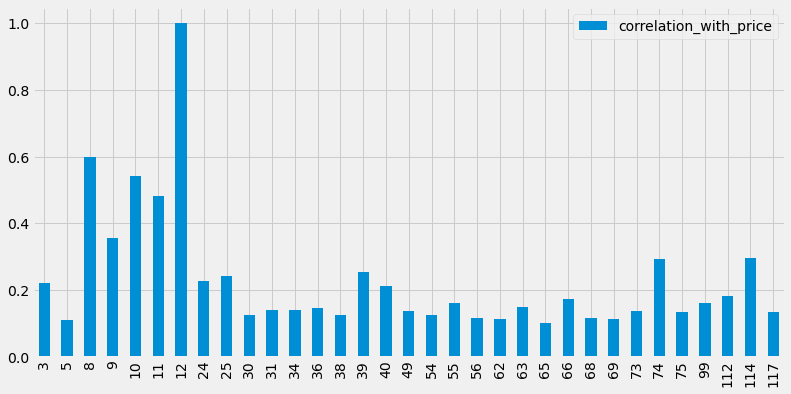

In [46]:
df1.plot( kind='bar', figsize=(12,6));

#Saving it as a variable to apply model to.
df1_col = ['host_total_listings_count', 'host_identity_verified', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'amenity_Air_conditioning_', 'amenity_Bathtub_', 'amenity_Cable_TV_', 'amenity_Coffee_maker_', 'amenity_Dishes_and_silverware_', 'amenity_Dishwasher_', 'amenity_Dryer_', 'amenity_Hair_dryer_', 'amenity_Indoor_fireplace_', 'amenity_Iron_', 'amenity_Kitchen_', 'amenity_Microwave_', 'amenity_Oven_', 'amenity_Patio_or_balcony_', 'amenity_Private_entrance_', 'amenity_Refrigerator_', 'amenity_Shampoo_', 'amenity_Stove_', 'amenity_TV_', 'amenity_Washer_', 'neighbourhood_cleansed_Kensington and Chelsea', 'neighbourhood_cleansed_Westminster', 'property_type_Entire house', 'property_type_Entire townhouse']
print(len(df1_col))

# Spearman correlation with price

In [47]:
dfs = pd.DataFrame(listings.corr(method="spearman")["price"])
dfs.reset_index(inplace=True)
dfs.columns = ["features", "correlation_with_price"]
dfs.sort_values("correlation_with_price", ascending=False)
df2 = dfs[dfs["correlation_with_price"] > 0.1]
corr_features = df2["features"].values
corr_features.tolist().append("price")
print(df2.shape)
df2.sort_values(by=['correlation_with_price'], ascending=False)

(38, 2)


,features,correlation_with_price
12,price,1.000000
8,accommodates,0.650061
25,calculated_host_listings_count_entire_homes,0.605641
10,bedrooms,0.556734
11,beds,0.517831
74,amenityTV,0.342270
9,bathrooms,0.311029
114,property_type_Entire house,0.266364
39,amenityDishwasher,0.260979
40,amenityDryer,0.216050


38

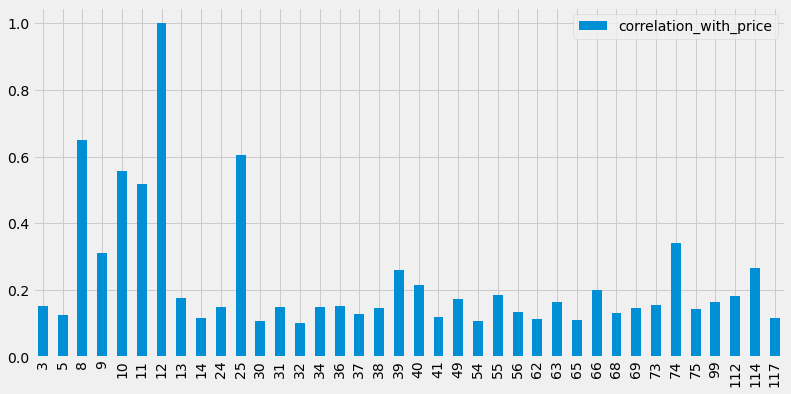

In [48]:
df2.plot( kind='bar', figsize=(12,6));

#Saving it as a variable to apply model on the features selected.
df2_col = ['amenity_Bed_linens_', 'maximum_nights', 'amenity_Elevator_', 'amenity_Cooking_basics_', 'minimum_nights','host_total_listings_count', 'host_identity_verified', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'amenity_Air_conditioning_', 'amenity_Bathtub_', 'amenity_Cable_TV_', 'amenity_Coffee_maker_', 'amenity_Dishes_and_silverware_', 'amenity_Dishwasher_', 'amenity_Dryer_', 'amenity_Hair_dryer_', 'amenity_Indoor_fireplace_', 'amenity_Iron_', 'amenity_Kitchen_', 'amenity_Microwave_', 'amenity_Oven_', 'amenity_Patio_or_balcony_', 'amenity_Private_entrance_', 'amenity_Refrigerator_', 'amenity_Shampoo_', 'amenity_Stove_', 'amenity_TV_', 'amenity_Washer_', 'neighbourhood_cleansed_Kensington and Chelsea', 'neighbourhood_cleansed_Westminster', 'property_type_Entire house', 'property_type_Entire townhouse']
len(df2_col)

# PCA

In [49]:
from sklearn.decomposition import PCA
from sklearn import preprocessing

features = listings
# Create and fit a PCA model
pca = PCA(n_components=2)

pca.fit(features)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [ ]:
# Look at the component loadings. 
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

In [ ]:
# project the features into these principle components
projectedAxes = pca.transform(features)

plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = "#D06B36", s = 50, alpha = 0.4, linewidth=0)

In [ ]:
loadings=pd.DataFrame(pca.components_,columns=listings.columns.values[:])
loadings=loadings.transpose()
loadings=loadings.abs()
loadings=loadings.sort_values(by =0,ascending=False)
print(loadings)

In [ ]:
listings.maximum_nights

In [ ]:
plt.hist(listings['maximum_nights'],bins=20)

In [ ]:
plt.hist(listings['days_host_since'],bins=20)

In [ ]:
#Dropped Maximum nights, days_host_since, host_total_listings_count, availability_365, 
#calculated_host_listings_count, calculated_host_listings_count_entire_homes, price

In [ ]:
#going to repeat the above but scale the features
features = listings

features=preprocessing.scale(features)

# Create and fit a PCA model
pca = PCA(n_components=2)

pca.fit(features)

# Look at the component loadings. 
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

# project the features into these principle components
projectedAxes = pca.transform(features)

plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = "#D06B36", s = 50, alpha = 0.4, linewidth=0)

loadings=pd.DataFrame(pca.components_,columns=listings.columns.values[:])
loadings=loadings.transpose()
loadings=loadings.abs()
loadings=loadings.sort_values(by =0,ascending=False)
print(loadings)

In [ ]:
plt.figure(1)
plt.suptitle('First two components')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
plt.scatter(projectedAxes[:,0], projectedAxes[:,1], c = listings['price'], cmap = plt.cm.Greens, s = 50, alpha = 0.8)

In [ ]:
from sklearn.cluster import KMeans

features = listings.iloc[:,1:]
knownLabels=listings.iloc[:,0]

features=preprocessing.scale(features)

print(features.shape)
print(len(knownLabels))

#computing K-Means with K = 3 (3 clusters)
kmeansModel = KMeans(init='random', n_clusters=4, n_init=10)
kmeansModel.fit_predict(features)
clusterLabels = kmeansModel.labels_

pca = PCA(n_components=2)


# We first fit a PCA model to the data
pca.fit(features)

# have a look at the components directly if we can notice any interesting structure
projectedAxes = pca.transform(features)
projectedAxes=pd.DataFrame(projectedAxes) #put into a dataframe so easier to filter

plt.figure(1)
plt.suptitle('Results of the algorithm visualised over PCs')
plt.xlabel('PC_1')
plt.ylabel('PC_2')
#draw 3 scatterplots on top of each other, using a different colour for each
plt.scatter(projectedAxes[clusterLabels==0][0], projectedAxes[clusterLabels==0][1], c = "#66c2a5", s = 50, alpha = 0.7, linewidth=0) # greenish
plt.scatter(projectedAxes[clusterLabels==1][0], projectedAxes[clusterLabels==1][1], c = "#fc8d62", s = 50, alpha = 0.7, linewidth=0) # orangish
plt.scatter(projectedAxes[clusterLabels==2][0], projectedAxes[clusterLabels==2][1], c = "#8da0cb", s = 50, alpha = 0.7, linewidth=0) # blueish
plt.scatter(projectedAxes[clusterLabels==3][0], projectedAxes[clusterLabels==3][1], c = "#17becf", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==4][0], projectedAxes[clusterLabels==4][1], c = "#bcbd22", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==5][0], projectedAxes[clusterLabels==5][1], c = "#7f7f7f", s = 50, alpha = 0.7, linewidth=0) # blueish
#plt.scatter(projectedAxes[clusterLabels==6][0], projectedAxes[clusterLabels==6][1], c = "#e377c2", s = 50, alpha = 0.7, linewidth=0) # blueish
plt.show()


#'#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'

In [ ]:
for i, clustLabel in enumerate(clusterLabels):
    print("Cluster result: ", clustLabel, " Known labels: ",knownLabels[i])

# Using Panda's corr() method calculates the relationship between each feature in relation to price

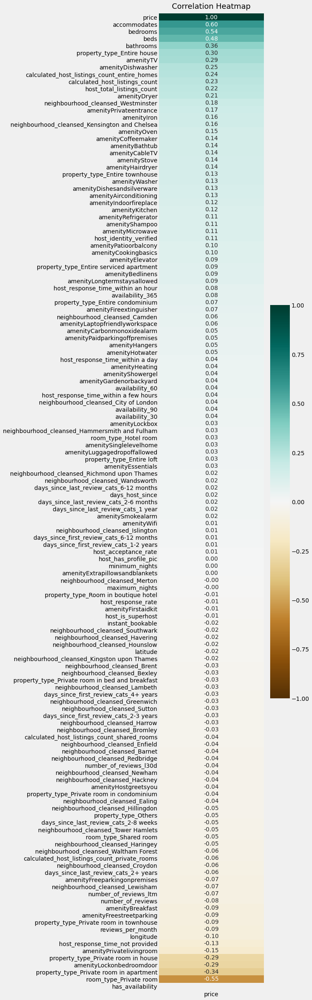

In [57]:
plt.figure(figsize=(5, 40))
feature_correlation = listings.corr()[['price']].sort_values(by='price', ascending=False)
# feature_correlation = feature_correlation[(feature_correlation > 0.1) & (feature_correlation != 1)]
# Show all features.
# heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')

# Show only price feature
heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

Text(0.5, 1.0, 'Correlation Heatmap')

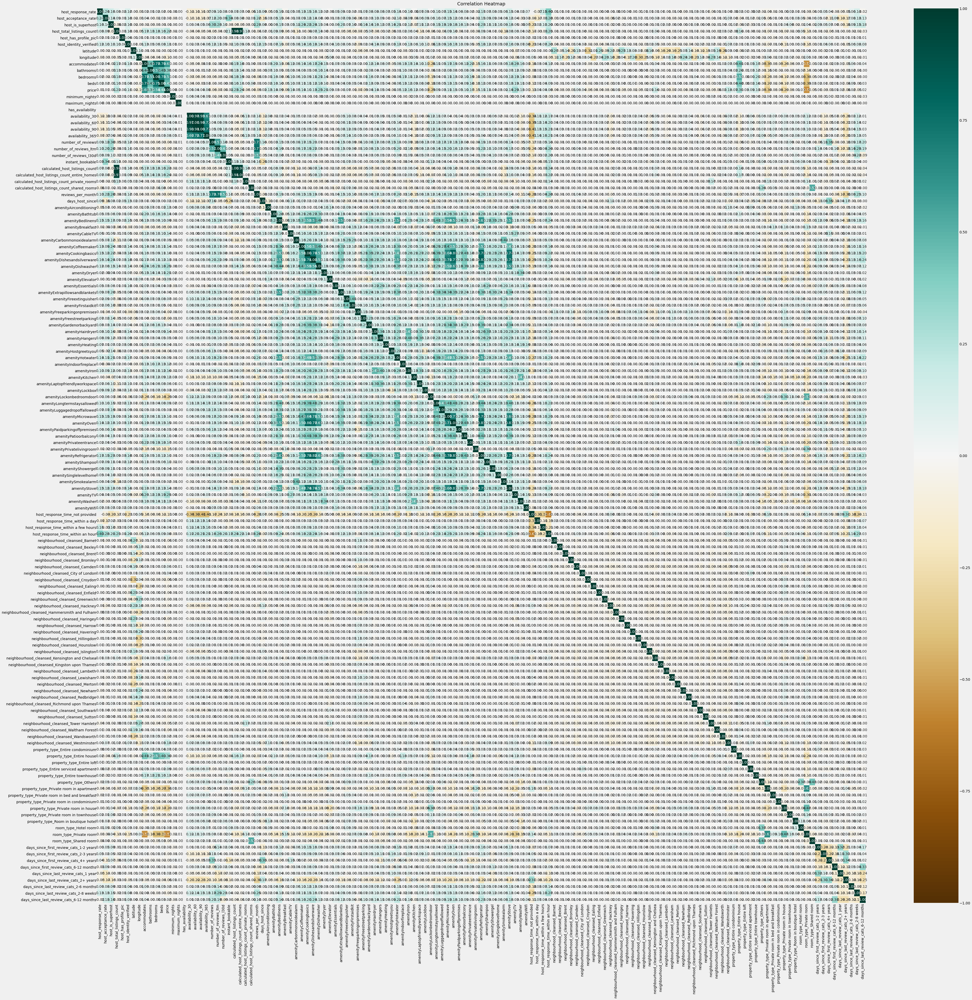

In [58]:
plt.figure(figsize=(60, 60))
feature_correlation = listings.corr()

# plt.figure(figsize=(5, 30))
# feature_correlation = listings.corr()[['price']].sort_values(by='price', ascending=False)

mask = (feature_correlation > 0.15) & (feature_correlation < 0.95) & (feature_correlation != 1)
# feature_correlation = feature_correlation[mask]

# Show all features.
# heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')

# Show only price feature
heatmap = sns.heatmap(feature_correlation, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)

In [59]:
feature_correlation_price = abs(feature_correlation['price'])
mask = (feature_correlation_price > 0.10) & (feature_correlation_price < 0.95) & (feature_correlation_price != 1)

# Columns to keep
columns_to_keep = list(feature_correlation_price[mask].index)

# Changed to include price for NN
columns_to_keep.append('price')

print(len(columns_to_keep))

columns_to_keep

40


['host_total_listings_count',
 'host_identity_verified',
 'longitude',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'amenityAirconditioning',
 'amenityBathtub',
 'amenityCableTV',
 'amenityCoffeemaker',
 'amenityDishesandsilverware',
 'amenityDishwasher',
 'amenityDryer',
 'amenityHairdryer',
 'amenityIndoorfireplace',
 'amenityIron',
 'amenityKitchen',
 'amenityLockonbedroomdoor',
 'amenityMicrowave',
 'amenityOven',
 'amenityPatioorbalcony',
 'amenityPrivateentrance',
 'amenityPrivatelivingroom',
 'amenityRefrigerator',
 'amenityShampoo',
 'amenityStove',
 'amenityTV',
 'amenityWasher',
 'host_response_time_not provided',
 'neighbourhood_cleansed_Kensington and Chelsea',
 'neighbourhood_cleansed_Westminster',
 'property_type_Entire house',
 'property_type_Entire townhouse',
 'property_type_Private room in apartment',
 'property_type_Private room in house',
 'room_type_Private room',
 'price']

# Variance Inflation Factors (VIFs)

In [60]:
from sklearn.preprocessing import MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

final_listings = listings[columns_to_keep]
final_listings = final_listings.drop('longitude', axis=1)

# Improve performance of ML algorithm due to smaller values. ML algorithms see larger numbers as more impactful.
final_listings_scaled = MinMaxScaler().fit_transform(final_listings)
final_listings_scaled_df = pd.DataFrame(final_listings_scaled, columns=final_listings.columns)
final_listings_scaled_df.head()

# Visualize cleaned dataset
final_listings_corr = final_listings_scaled_df.corr()

# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(final_listings_corr.values, i) for i in range(final_listings_corr.shape[1])]
vif["features"] = final_listings_corr.columns
vif = vif.round(1)

pd.set_option('max_rows', None)
display(vif.sort_values('VIF', ascending=False))

,VIF,features
6,10525.1,calculated_host_listings_count
7,6304.4,calculated_host_listings_count_entire_homes
0,2739.0,host_total_listings_count
37,245.8,room_type_Private room
25,215.6,amenityRefrigerator
21,195.1,amenityOven
2,92.2,accommodates
35,88.8,property_type_Private room in apartment
27,86.2,amenityStove
12,76.4,amenityDishesandsilverware


In [61]:
final_listings_scaled_df.shape

(75287, 39)

# Baseline Modeling: MLP

In [62]:
# Input listings, neigbourhoods, reviews - Airbnb datasets
#listings = pd.read_csv('nov2020/listings.csv')
listings = final_listings_scaled_df
print (listings.head())
#neighbourhoods = pd.read_csv('nov2020/neighbourhoods.csv')
#print (neighbourhoods.head())
#reviews = pd.read_csv('nov2020/reviews.csv')
#print (reviews.head())

   host_total_listings_count  host_identity_verified  accommodates  bathrooms  \
0                   0.002013                     1.0      0.200000   0.028571   
1                   0.002013                     1.0      0.066667   0.028571   
2                   0.000671                     1.0      0.066667   0.028571   
3                   0.012081                     1.0      0.333333   0.057143   
4                   0.002013                     1.0      0.066667   0.028571   

   bedrooms  beds  calculated_host_listings_count  \
0  0.000000  0.06                        0.001140   
1  0.000000  0.00                        0.001140   
2  0.000000  0.02                        0.000000   
3  0.040816  0.06                        0.015964   
4  0.000000  0.02                        0.001140   

   calculated_host_listings_count_entire_homes  amenityAirconditioning  \
0                                     0.002281                     0.0   
1                                     0.001140

In [63]:
# Columns and their empty values:
print (listings.isnull().sum())

host_total_listings_count                        0
host_identity_verified                           0
accommodates                                     0
bathrooms                                        0
bedrooms                                         0
beds                                             0
calculated_host_listings_count                   0
calculated_host_listings_count_entire_homes      0
amenityAirconditioning                           0
amenityBathtub                                   0
amenityCableTV                                   0
amenityCoffeemaker                               0
amenityDishesandsilverware                       0
amenityDishwasher                                0
amenityDryer                                     0
amenityHairdryer                                 0
amenityIndoorfireplace                           0
amenityIron                                      0
amenityKitchen                                   0
amenityLockonbedroomdoor       

In [64]:
# Splitting data
X = listings.drop('price', axis=1)
y = listings['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



71565    0.108466
30082    0.296296
11572    0.100529
72739    0.201058
34183    0.132275
61851    0.198413
43165    0.277778
10329    0.211640
63989    0.105820
53807    0.105820
5346     0.153439
13179    0.132275
55662    0.140212
17513    0.285714
73912    0.079365
38306    0.396825
32354    0.074074
40948    0.126984
45742    0.767196
65050    0.079365
33868    0.132275
39370    0.079365
30308    0.232804
45666    0.095238
54752    0.476190
22198    0.269841
11496    0.156085
14561    0.074074
53755    0.198413
64884    0.587302
43107    0.476190
39692    0.518519
58534    0.092593
49172    0.103175
20696    0.105820
74188    0.396825
40191    0.198413
65111    0.105820
44940    0.211640
18412    0.158730
5945     0.343915
25965    0.224868
46320    0.410053
53439    0.629630
50679    0.063492
38934    0.211640
53150    0.174603
13958    0.449735
72824    0.198413
70689    0.208995
13839    0.436508
8227     0.105820
31563    0.129630
12580    0.132275
68434    0.579365
12619    0

23080    0.944444
53287    0.595238
454      0.185185
2107     0.529101
12266    0.079365
57140    0.182540
42632    0.140212
74190    0.449735
30948    0.079365
3799     0.071429
6681     0.105820
12547    0.224868
54255    0.476190
12890    0.145503
1583     0.343915
17278    0.153439
44873    0.079365
10105    0.714286
57670    0.121693
73501    0.238095
69761    0.240741
71389    0.063492
38486    0.238095
4896     0.169312
27783    0.111111
967      0.370370
9075     0.132275
65739    0.145503
19626    0.119048
29774    0.068783
9826     0.103175
53245    0.171958
74370    0.396825
27367    0.119048
9367     0.190476
40590    0.396825
67537    0.211640
68065    0.264550
38545    0.079365
61320    0.002646
62675    0.224868
2780     0.132275
26820    0.582011
31664    0.119048
26891    0.066138
3840     0.264550
21055    0.230159
15663    0.055556
9767     0.439153
73271    0.957672
38263    0.055556
49260    0.264550
34109    0.396825
37369    0.277778
253      0.079365
63799    0

In [65]:
# Keras Sequential Model

tf.keras.backend.set_floatx('float32')
model = tf.keras.Sequential([
    #DenseFeatures(feature_layer),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(1)    
])

opt = tf.keras.optimizers.Adam(learning_rate=0.05)
rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(optimizer=opt, loss='mean_squared_error', metrics=['mae',rmse])

lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',patience=2,factor=0.2)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=10)
callbacks = [lr_reducer, early_stopper]

#history = model.fit(X_train, y_train, validation_data=(X_test,y_test), callbacks=callbacks, epochs=50, batch_size=64)
# Testing without early stopper
history = model.fit(X_train, y_train, validation_data=(X_test,y_test), epochs=50, batch_size=64)

Epoch 1/50
942/942 [==============================] - 39s 40ms/step - loss: 0.0303 - mae: 0.0981 - root_mean_squared_error: 0.1739 - val_loss: 0.0165 - val_mae: 0.0842 - val_root_mean_squared_error: 0.1285
Epoch 2/50
942/942 [==============================] - 4s 4ms/step - loss: 0.0173 - mae: 0.0903 - root_mean_squared_error: 0.1314 - val_loss: 0.0186 - val_mae: 0.1033 - val_root_mean_squared_error: 0.1363
Epoch 3/50
942/942 [==============================] - 4s 4ms/step - loss: 0.0184 - mae: 0.0938 - root_mean_squared_error: 0.1356 - val_loss: 0.0210 - val_mae: 0.1192 - val_root_mean_squared_error: 0.1450
Epoch 4/50
942/942 [==============================] - 4s 4ms/step - loss: 0.0180 - mae: 0.0931 - root_mean_squared_error: 0.1343 - val_loss: 0.0187 - val_mae: 0.1006 - val_root_mean_squared_error: 0.1369
Epoch 5/50
942/942 [==============================] - 4s 4ms/step - loss: 0.0182 - mae: 0.0937 - root_mean_squared_error: 0.1350 - val_loss: 0.0181 - val_mae: 0.1041 - val_root_mean_

Epoch 41/50
942/942 [==============================] - 4s 4ms/step - loss: 0.0202 - mae: 0.1021 - root_mean_squared_error: 0.1420 - val_loss: 0.0225 - val_mae: 0.1264 - val_root_mean_squared_error: 0.1499
Epoch 42/50
942/942 [==============================] - 3s 4ms/step - loss: 0.0203 - mae: 0.1021 - root_mean_squared_error: 0.1425 - val_loss: 0.0238 - val_mae: 0.1278 - val_root_mean_squared_error: 0.1542
Epoch 43/50
942/942 [==============================] - 3s 3ms/step - loss: 0.0210 - mae: 0.1033 - root_mean_squared_error: 0.1448 - val_loss: 0.0231 - val_mae: 0.1228 - val_root_mean_squared_error: 0.1520
Epoch 44/50
942/942 [==============================] - 3s 3ms/step - loss: 0.0212 - mae: 0.1049 - root_mean_squared_error: 0.1455 - val_loss: 0.0251 - val_mae: 0.1340 - val_root_mean_squared_error: 0.1583
Epoch 45/50
942/942 [==============================] - 3s 4ms/step - loss: 0.0228 - mae: 0.1084 - root_mean_squared_error: 0.1511 - val_loss: 0.0203 - val_mae: 0.1044 - val_root_me

Assessing

In [66]:
X = listings.drop('price', axis=1)
y = listings['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_r2 = r2_score(y_test, y_test_preds)
train_r2 = r2_score(y_train, y_train_preds)
test_rmse = mean_squared_error(y_test, y_test_preds) ** (1/2)
train_rmse = mean_squared_error(y_train, y_train_preds) ** (1/2)

test_mae = mean_absolute_error(y_test, y_test_preds)
train_mae = mean_absolute_error(y_train, y_train_preds)

print("""
        R2 for test data: {}
        R2 for train data: {}
        
        RMSE for test data: {}
        RMSE for train data: {}
        
        Mean Absolute Error for test data: {}
        Mean Absolute Error for train data: {}
    """.format(test_r2, train_r2, test_rmse, train_rmse, test_mae, train_mae)
     )


        R2 for test data: 0.5335449602374204
        R2 for train data: 0.5188216089045896
        
        RMSE for test data: 0.12044876693376413
        RMSE for train data: 0.12162399957670184
        
        Mean Absolute Error for test data: 0.08041275708109721
        Mean Absolute Error for train data: 0.08116925902239976
    


# Final Models

Splitting data

In [83]:
X = listings.drop('price', axis=1)
y = listings['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

Keep the following?

In [84]:
tf.keras.backend.set_floatx('float32')

Neural network 1: Basic keras sequential model using 2 hidden layers, sigmoid activation function, adam optimiser and 20 epochs

In [88]:
model = tf.keras.Sequential([
    Dense(128, activation='sigmoid'), # Hidden layer
    Dense(64, activation='sigmoid'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=20, batch_size=64)

Epoch 1/20
942/942 - 53s - loss: 0.0175 - mae: 0.0919 - root_mean_squared_error: 0.1324 - val_loss: 0.0165 - val_mae: 0.0963 - val_root_mean_squared_error: 0.1284 - 53s/epoch - 57ms/step
Epoch 2/20
942/942 - 4s - loss: 0.0157 - mae: 0.0857 - root_mean_squared_error: 0.1254 - val_loss: 0.0154 - val_mae: 0.0881 - val_root_mean_squared_error: 0.1241 - 4s/epoch - 4ms/step
Epoch 3/20
942/942 - 4s - loss: 0.0156 - mae: 0.0856 - root_mean_squared_error: 0.1250 - val_loss: 0.0157 - val_mae: 0.0912 - val_root_mean_squared_error: 0.1255 - 4s/epoch - 4ms/step
Epoch 4/20
942/942 - 4s - loss: 0.0154 - mae: 0.0848 - root_mean_squared_error: 0.1242 - val_loss: 0.0147 - val_mae: 0.0808 - val_root_mean_squared_error: 0.1211 - 4s/epoch - 4ms/step
Epoch 5/20
942/942 - 4s - loss: 0.0154 - mae: 0.0844 - root_mean_squared_error: 0.1240 - val_loss: 0.0157 - val_mae: 0.0813 - val_root_mean_squared_error: 0.1253 - 4s/epoch - 4ms/step
Epoch 6/20
942/942 - 4s - loss: 0.0153 - mae: 0.0843 - root_mean_squared_erro

Neural network 2: Same as before, but increasing number of epochs

In [90]:
model = tf.keras.Sequential([
    Dense(128, activation='sigmoid'), # Hidden layer
    Dense(64, activation='sigmoid'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=50, batch_size=64)

Epoch 1/50
942/942 - 50s - loss: 0.0176 - mae: 0.0922 - root_mean_squared_error: 0.1325 - val_loss: 0.0150 - val_mae: 0.0830 - val_root_mean_squared_error: 0.1226 - 50s/epoch - 54ms/step
Epoch 2/50
942/942 - 4s - loss: 0.0157 - mae: 0.0856 - root_mean_squared_error: 0.1251 - val_loss: 0.0148 - val_mae: 0.0808 - val_root_mean_squared_error: 0.1218 - 4s/epoch - 4ms/step
Epoch 3/50
942/942 - 4s - loss: 0.0157 - mae: 0.0860 - root_mean_squared_error: 0.1254 - val_loss: 0.0147 - val_mae: 0.0811 - val_root_mean_squared_error: 0.1213 - 4s/epoch - 4ms/step
Epoch 4/50
942/942 - 4s - loss: 0.0156 - mae: 0.0852 - root_mean_squared_error: 0.1248 - val_loss: 0.0147 - val_mae: 0.0803 - val_root_mean_squared_error: 0.1213 - 4s/epoch - 4ms/step
Epoch 5/50
942/942 - 4s - loss: 0.0153 - mae: 0.0839 - root_mean_squared_error: 0.1236 - val_loss: 0.0147 - val_mae: 0.0794 - val_root_mean_squared_error: 0.1214 - 4s/epoch - 4ms/step
Epoch 6/50
942/942 - 4s - loss: 0.0153 - mae: 0.0840 - root_mean_squared_erro

Epoch 46/50
942/942 - 4s - loss: 0.0138 - mae: 0.0790 - root_mean_squared_error: 0.1176 - val_loss: 0.0142 - val_mae: 0.0767 - val_root_mean_squared_error: 0.1192 - 4s/epoch - 4ms/step
Epoch 47/50
942/942 - 4s - loss: 0.0138 - mae: 0.0787 - root_mean_squared_error: 0.1174 - val_loss: 0.0137 - val_mae: 0.0758 - val_root_mean_squared_error: 0.1171 - 4s/epoch - 4ms/step
Epoch 48/50
942/942 - 4s - loss: 0.0137 - mae: 0.0786 - root_mean_squared_error: 0.1172 - val_loss: 0.0137 - val_mae: 0.0817 - val_root_mean_squared_error: 0.1170 - 4s/epoch - 4ms/step
Epoch 49/50
942/942 - 4s - loss: 0.0137 - mae: 0.0784 - root_mean_squared_error: 0.1171 - val_loss: 0.0136 - val_mae: 0.0775 - val_root_mean_squared_error: 0.1165 - 4s/epoch - 4ms/step
Epoch 50/50
942/942 - 4s - loss: 0.0137 - mae: 0.0786 - root_mean_squared_error: 0.1172 - val_loss: 0.0134 - val_mae: 0.0770 - val_root_mean_squared_error: 0.1159 - 4s/epoch - 4ms/step


Neural network 3: Increasing number of units in hidden layers (Check if loss jumps around - indicates too many units)

In [91]:
model = tf.keras.Sequential([
    Dense(1024, activation='sigmoid'), # Hidden layer
    Dense(128, activation='sigmoid'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=50, batch_size=64)

Epoch 1/50
942/942 - 52s - loss: 0.0235 - mae: 0.1018 - root_mean_squared_error: 0.1534 - val_loss: 0.0178 - val_mae: 0.1042 - val_root_mean_squared_error: 0.1335 - 52s/epoch - 55ms/step
Epoch 2/50
942/942 - 6s - loss: 0.0164 - mae: 0.0886 - root_mean_squared_error: 0.1280 - val_loss: 0.0150 - val_mae: 0.0806 - val_root_mean_squared_error: 0.1224 - 6s/epoch - 6ms/step
Epoch 3/50
942/942 - 6s - loss: 0.0158 - mae: 0.0856 - root_mean_squared_error: 0.1258 - val_loss: 0.0155 - val_mae: 0.0898 - val_root_mean_squared_error: 0.1243 - 6s/epoch - 6ms/step
Epoch 4/50
942/942 - 6s - loss: 0.0156 - mae: 0.0848 - root_mean_squared_error: 0.1250 - val_loss: 0.0147 - val_mae: 0.0810 - val_root_mean_squared_error: 0.1214 - 6s/epoch - 6ms/step
Epoch 5/50
942/942 - 6s - loss: 0.0154 - mae: 0.0837 - root_mean_squared_error: 0.1240 - val_loss: 0.0145 - val_mae: 0.0807 - val_root_mean_squared_error: 0.1204 - 6s/epoch - 6ms/step
Epoch 6/50
942/942 - 6s - loss: 0.0151 - mae: 0.0831 - root_mean_squared_erro

Epoch 46/50
942/942 - 6s - loss: 0.0139 - mae: 0.0794 - root_mean_squared_error: 0.1181 - val_loss: 0.0143 - val_mae: 0.0757 - val_root_mean_squared_error: 0.1196 - 6s/epoch - 6ms/step
Epoch 47/50
942/942 - 5s - loss: 0.0139 - mae: 0.0793 - root_mean_squared_error: 0.1179 - val_loss: 0.0135 - val_mae: 0.0792 - val_root_mean_squared_error: 0.1162 - 5s/epoch - 6ms/step
Epoch 48/50
942/942 - 6s - loss: 0.0138 - mae: 0.0790 - root_mean_squared_error: 0.1176 - val_loss: 0.0136 - val_mae: 0.0758 - val_root_mean_squared_error: 0.1164 - 6s/epoch - 6ms/step
Epoch 49/50
942/942 - 6s - loss: 0.0138 - mae: 0.0790 - root_mean_squared_error: 0.1175 - val_loss: 0.0141 - val_mae: 0.0853 - val_root_mean_squared_error: 0.1189 - 6s/epoch - 6ms/step
Epoch 50/50
942/942 - 5s - loss: 0.0138 - mae: 0.0788 - root_mean_squared_error: 0.1174 - val_loss: 0.0135 - val_mae: 0.0767 - val_root_mean_squared_error: 0.1161 - 5s/epoch - 6ms/step


Neural network 4: Using relu activation function instead of sigmoid

In [92]:
model = tf.keras.Sequential([
    Dense(1024, activation='relu'), # Hidden layer
    Dense(128, activation='relu'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), verbose=2, epochs=50, batch_size=64)


Epoch 1/50
942/942 - 46s - loss: 0.0161 - mae: 0.0852 - root_mean_squared_error: 0.1269 - val_loss: 0.0157 - val_mae: 0.0809 - val_root_mean_squared_error: 0.1253 - 46s/epoch - 49ms/step
Epoch 2/50
942/942 - 6s - loss: 0.0148 - mae: 0.0814 - root_mean_squared_error: 0.1217 - val_loss: 0.0148 - val_mae: 0.0868 - val_root_mean_squared_error: 0.1218 - 6s/epoch - 6ms/step
Epoch 3/50
942/942 - 6s - loss: 0.0143 - mae: 0.0800 - root_mean_squared_error: 0.1197 - val_loss: 0.0140 - val_mae: 0.0766 - val_root_mean_squared_error: 0.1184 - 6s/epoch - 6ms/step
Epoch 4/50
942/942 - 6s - loss: 0.0141 - mae: 0.0792 - root_mean_squared_error: 0.1186 - val_loss: 0.0138 - val_mae: 0.0763 - val_root_mean_squared_error: 0.1175 - 6s/epoch - 6ms/step
Epoch 5/50
942/942 - 6s - loss: 0.0138 - mae: 0.0784 - root_mean_squared_error: 0.1175 - val_loss: 0.0148 - val_mae: 0.0856 - val_root_mean_squared_error: 0.1215 - 6s/epoch - 6ms/step
Epoch 6/50
942/942 - 6s - loss: 0.0136 - mae: 0.0781 - root_mean_squared_erro

Epoch 46/50
942/942 - 6s - loss: 0.0090 - mae: 0.0637 - root_mean_squared_error: 0.0950 - val_loss: 0.0149 - val_mae: 0.0801 - val_root_mean_squared_error: 0.1221 - 6s/epoch - 6ms/step
Epoch 47/50
942/942 - 6s - loss: 0.0089 - mae: 0.0633 - root_mean_squared_error: 0.0945 - val_loss: 0.0147 - val_mae: 0.0782 - val_root_mean_squared_error: 0.1212 - 6s/epoch - 6ms/step
Epoch 48/50
942/942 - 6s - loss: 0.0089 - mae: 0.0630 - root_mean_squared_error: 0.0943 - val_loss: 0.0148 - val_mae: 0.0789 - val_root_mean_squared_error: 0.1218 - 6s/epoch - 6ms/step
Epoch 49/50
942/942 - 6s - loss: 0.0089 - mae: 0.0629 - root_mean_squared_error: 0.0941 - val_loss: 0.0153 - val_mae: 0.0817 - val_root_mean_squared_error: 0.1239 - 6s/epoch - 6ms/step
Epoch 50/50
942/942 - 6s - loss: 0.0088 - mae: 0.0629 - root_mean_squared_error: 0.0938 - val_loss: 0.0148 - val_mae: 0.0784 - val_root_mean_squared_error: 0.1217 - 6s/epoch - 6ms/step


Neural network 5: Adding early stopping

In [93]:
model = tf.keras.Sequential([
    Dense(1024, activation='relu'), # Hidden layer
    Dense(128, activation='relu'), # Hidden
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',patience=2,factor=0.2)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=10)
callbacks = [lr_reducer, early_stopper]

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), callbacks=callbacks, epochs=50, batch_size=64)

Epoch 1/50
942/942 [==============================] - 61s 64ms/step - loss: 0.0166 - mae: 0.0863 - root_mean_squared_error: 0.1289 - val_loss: 0.0166 - val_mae: 0.0810 - val_root_mean_squared_error: 0.1287 - lr: 0.0010
Epoch 2/50
942/942 [==============================] - 6s 7ms/step - loss: 0.0147 - mae: 0.0812 - root_mean_squared_error: 0.1213 - val_loss: 0.0144 - val_mae: 0.0836 - val_root_mean_squared_error: 0.1201 - lr: 0.0010
Epoch 3/50
942/942 [==============================] - 6s 6ms/step - loss: 0.0143 - mae: 0.0799 - root_mean_squared_error: 0.1197 - val_loss: 0.0140 - val_mae: 0.0793 - val_root_mean_squared_error: 0.1184 - lr: 0.0010
Epoch 4/50
942/942 [==============================] - 6s 6ms/step - loss: 0.0141 - mae: 0.0792 - root_mean_squared_error: 0.1187 - val_loss: 0.0139 - val_mae: 0.0790 - val_root_mean_squared_error: 0.1179 - lr: 0.0010
Epoch 5/50
942/942 [==============================] - 6s 6ms/step - loss: 0.0139 - mae: 0.0787 - root_mean_squared_error: 0.1177 -

Neural network 6: Adding dropout

In [95]:
model = tf.keras.Sequential([
    Dense(1024, activation='relu'), # Hidden layer
    Dense(128, activation='relu'), # Hidden
    Dropout(0.3), # Dropout layer
    Dense(1) # Output layer
])

rmse = tf.keras.metrics.RootMeanSquaredError()
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mae',rmse])

lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',patience=2,factor=0.2)
early_stopper = tf.keras.callbacks.EarlyStopping(patience=10)
callbacks = [lr_reducer, early_stopper]

history = model.fit(X_train, y_train, validation_data=(X_test,y_test), callbacks=callbacks, epochs=50, batch_size=64)

Epoch 1/50
942/942 [==============================] - 51s 53ms/step - loss: 0.0179 - mae: 0.0894 - root_mean_squared_error: 0.1336 - val_loss: 0.0172 - val_mae: 0.0820 - val_root_mean_squared_error: 0.1313 - lr: 0.0010
Epoch 2/50
942/942 [==============================] - 8s 9ms/step - loss: 0.0156 - mae: 0.0837 - root_mean_squared_error: 0.1249 - val_loss: 0.0142 - val_mae: 0.0792 - val_root_mean_squared_error: 0.1190 - lr: 0.0010
Epoch 3/50
942/942 [==============================] - 8s 8ms/step - loss: 0.0149 - mae: 0.0819 - root_mean_squared_error: 0.1220 - val_loss: 0.0140 - val_mae: 0.0772 - val_root_mean_squared_error: 0.1182 - lr: 0.0010
Epoch 4/50
942/942 [==============================] - 8s 9ms/step - loss: 0.0146 - mae: 0.0814 - root_mean_squared_error: 0.1207 - val_loss: 0.0142 - val_mae: 0.0807 - val_root_mean_squared_error: 0.1192 - lr: 0.0010
Epoch 5/50
942/942 [==============================] - 8s 9ms/step - loss: 0.0144 - mae: 0.0810 - root_mean_squared_error: 0.1200 -

...

# Saving Neural Network (HDF5)

In [97]:
import os

save_path = "."
model.save(os.path.join(save_path,"network.h5"))

# To load:
#from tensorflow.keras.models import load_model
#loaded_model = load_model(os.path.join(save_path,"network.h5"))

# Plotting Loss

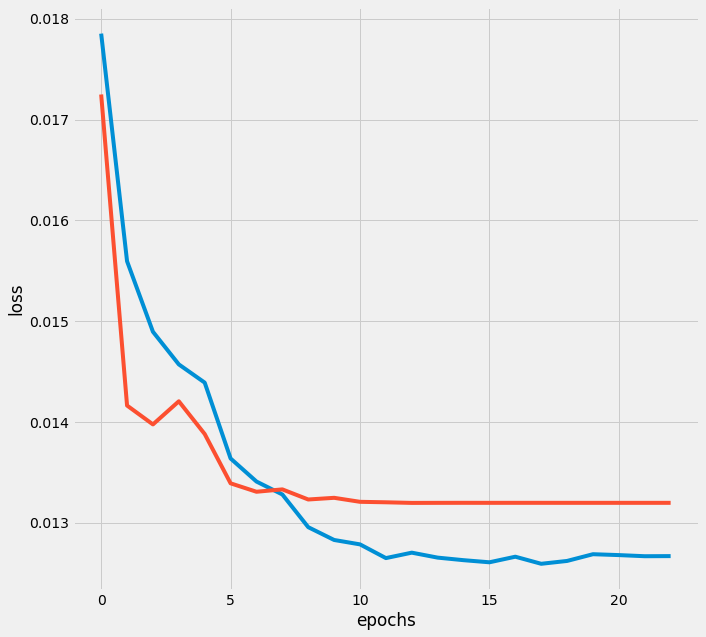

In [98]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

Possibly reduce early stopper patience

# Failed Prediction

In [99]:
pred = model.predict(X_test)
pred = np.argmax(pred,axis=1)
y_compare = np.argmax(y_test,axis=1) 
score = metrics.accuracy_score(y_compare, pred)
print("Accuracy score: {}".format(score))

ValueError: `axis` must be fewer than the number of dimensions (1)

# Evaluating Train and Test data

Root Mean Squared Error, R^2, Mean Asbolute Error for Training and Testing sets

In [102]:
pred_train = model.predict(X_train)

pred = model.predict(X_test)

print("""
        Training RMSE: {}
        Test RMSE: {}
        
        Training R2: {}
        Test R2: {}
        
        Training Mean Absolute Error: {}
        Test Mean Absolute Error: {}
    """.format(mean_squared_error(y_train, pred_train) ** (1/2),
               mean_squared_error(y_test, pred) ** (1/2),
               r2_score(y_train, pred_train),
               r2_score(y_test, pred),
               mean_absolute_error(y_train, pred_train),
               mean_absolute_error(y_test, pred)
              )
     )


        Training RMSE: 0.11056836778426538
        Test RMSE: 0.11488700774128456
        
        Training R2: 0.6023240283780938
        Test R2: 0.5756278162291513
        
        Training Mean Absolute Error: 0.07396440312046278
        Test Mean Absolute Error: 0.07612098893761488
    
